# HECATE-DS

HarvEsting loCAl specTra with Exoplanets (Doppler Shadow)

I will run the modular components of the tool, including two main modules:

1. Extraction
2. Analysis

I will also add a class just for plots, a class to compute CCFs and a class to run SOAP.

this way, when the user wants to extract the local spectra, the code will fetch the auxiliar functions, but at the same time the user can run the CCFs and SOAP separately.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from utils import get_phase_mu
from HECATE import HECATE
from build_CCF import build_CCF
from sysvel_correction import sysvel_correction
from run_SOAP import run_SOAP

from get_data import *
from plots import *

In [2]:
stellar_params = {
                "Teff":4969, "Teff_err":43,   #effective temperature [K]
                "logg":4.60, "logg_err":0.01, #superficial gravity [dex]
                "FeH":-0.07, "FeH_err":0.02,  #metallicity [dex]
                "P_rot":2.21857312,           #rotation period [d]
                "R_star":0.766,               #radius [solar radii]
                "inc_star":71.87              #stellar inclination [º]
                }

planet_params = {
                "P_orb":2.21857312,           #orbital period [d]
                "a_R":8.76863,                #system scale [stellar radii]
                "Rp_Rs":0.1602,               #planet-to-star radius ratio 
                "t0":53988.30339,             #mid-transit time [d]
                "e":0,                        #orbital eccentricity
                "w":90,                       #argument of periastron [º]
                "inc_planet":85.465,          #planet inclination [º]
                "lbda":-1.00,                 #spin-orbit angle [º]
                "dfp": -0.002424              #mid-transit phase shift
                }

# White light CCF

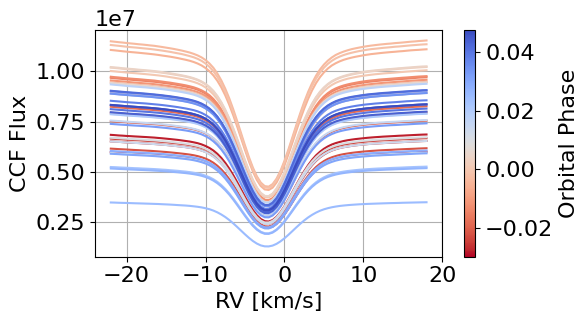

In [3]:
CCFs, time, airmass, berv, bervmax, snr, list_ccfs = get_CCFs(planet_params, day='2021-08-31')

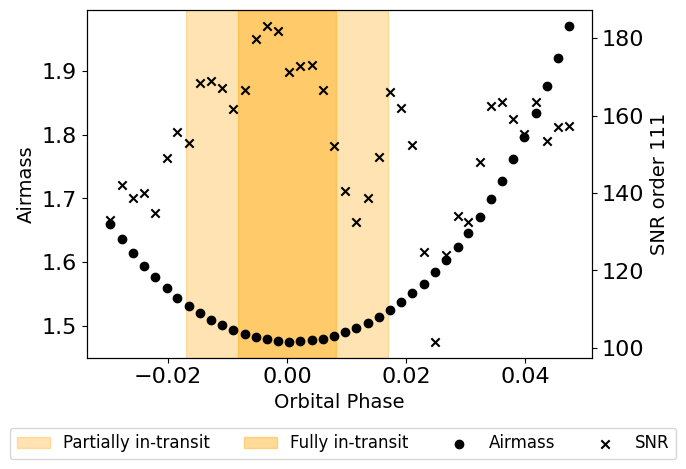

In [4]:
plot_air_snr(planet_params, time, airmass, snr)

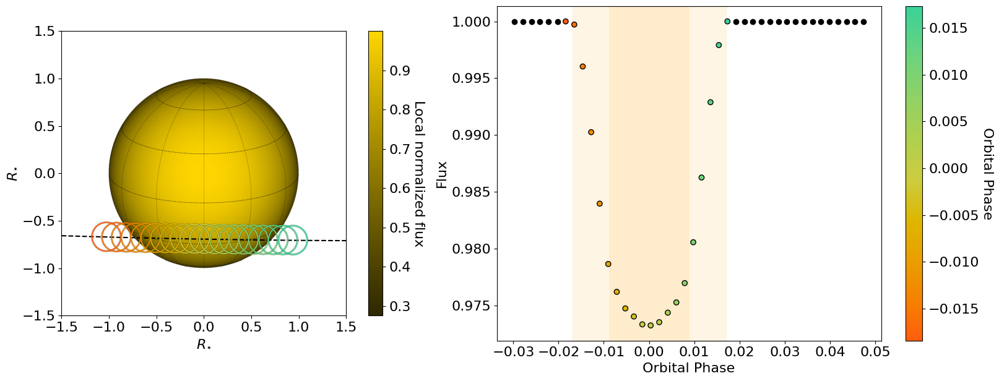

In [5]:
Flux_SOAP = run_SOAP(time, stellar_params, planet_params, plot=True).flux

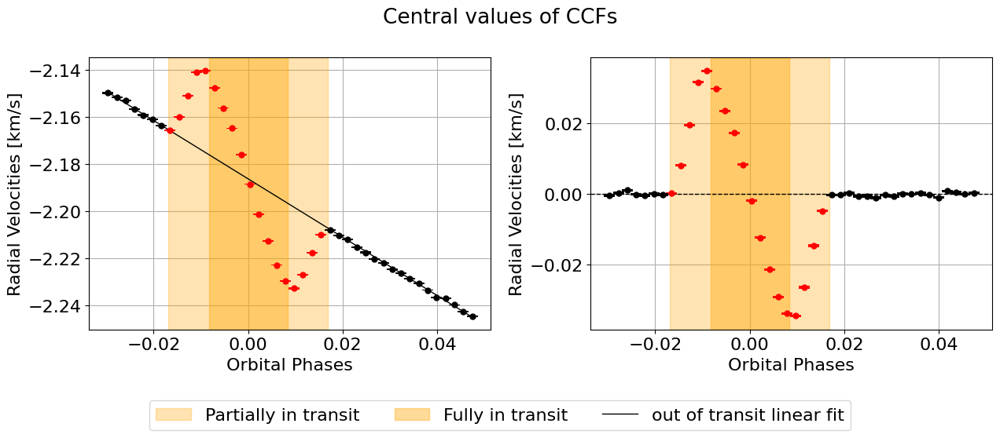

In [6]:
sysvel_corr = sysvel_correction(planet_params, time, CCFs, model="modified Gaussian", plot_fits=False, plot_sys_vel=True)

CCFs_sysvel_corr = sysvel_corr.CCFs_sysvel_corr
x0_corr = sysvel_corr.x0_corr

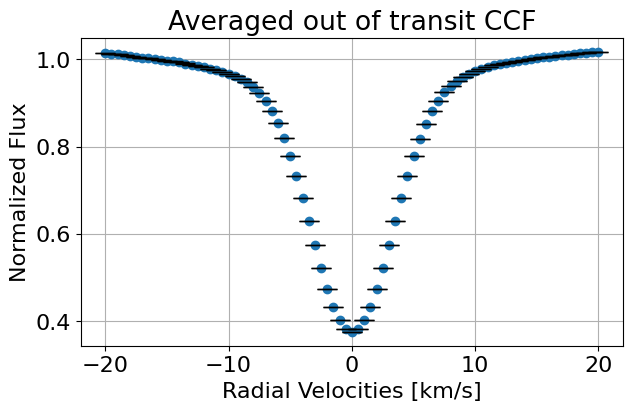

In [7]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_sysvel_corr)

RV_reference = np.arange(round(np.max(CCFs_sysvel_corr[:,2,0])), round(np.min(CCFs_sysvel_corr[:,2,-1]))+0.5, 0.5)

CCF_interp, avg_out_of_transit_CCF = hecate._avg_out_of_transit_CCF(CCFs_sysvel_corr, RV_reference, plot=True, save=None)

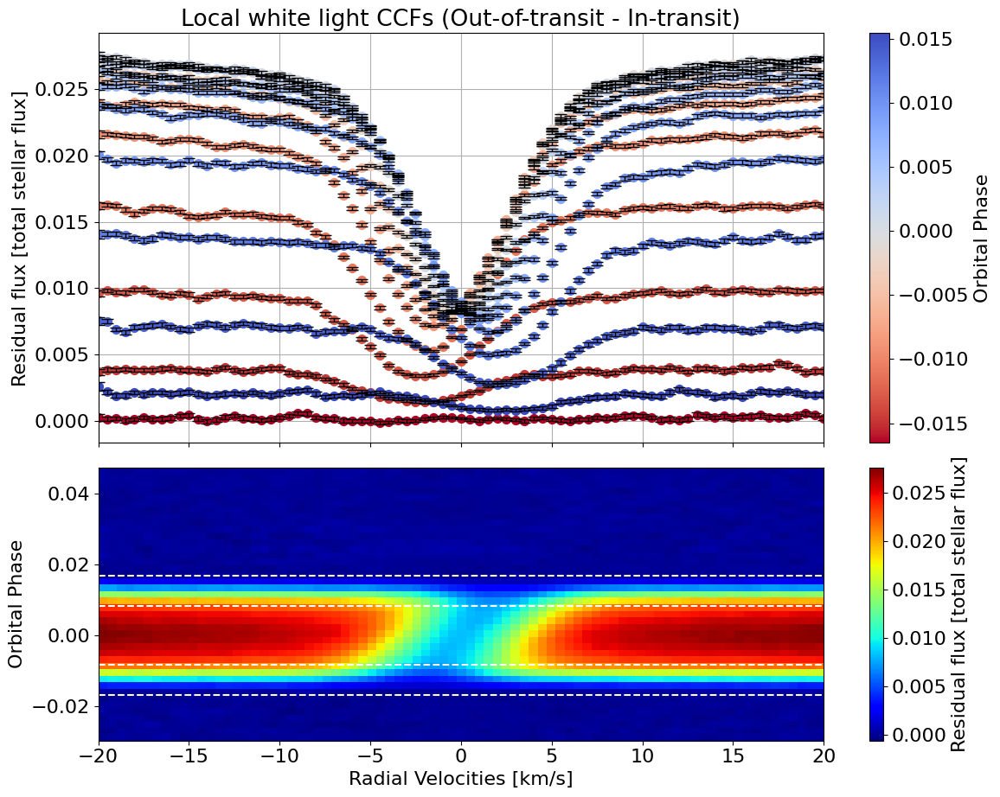

In [8]:
hecate = HECATE(planet_params, stellar_params, time, CCFs)

plot = {"SOAP":False, "fits_initial_CCF":False, "sys_vel":False, "avg_out_of_transit_CCF":False, "local_CCFs":True}

ccf_type = "white light"
model_fit = "modified Gaussian"

local_CCFs, CCFs_sub_all, CCFs_flux_corr, phases, in_phases = hecate._extract_local_CCF(model_fit, ccf_type, plot, save=None)

##############################
Fitting modified Gaussian model to master CCF
------------------------------
Fit parameters:
y0 = 0.999683 ± 0.000005
x0 = -0.000254 ± 0.000051
sigma = 3.387211 ± 0.000094
a = 0.630892 ± 0.000011
c = 1.820668 ± 0.000088
R^2:  0.9983
------------------------------
CCF parameters:
Central RV [km/s]: -0.000254 ± 0.000051
Continuum: 0.999683 ± 0.000005
Deph [%]: 36.890814 ± 0.001150
Width [km/s]: 3.387211 ± 0.000094


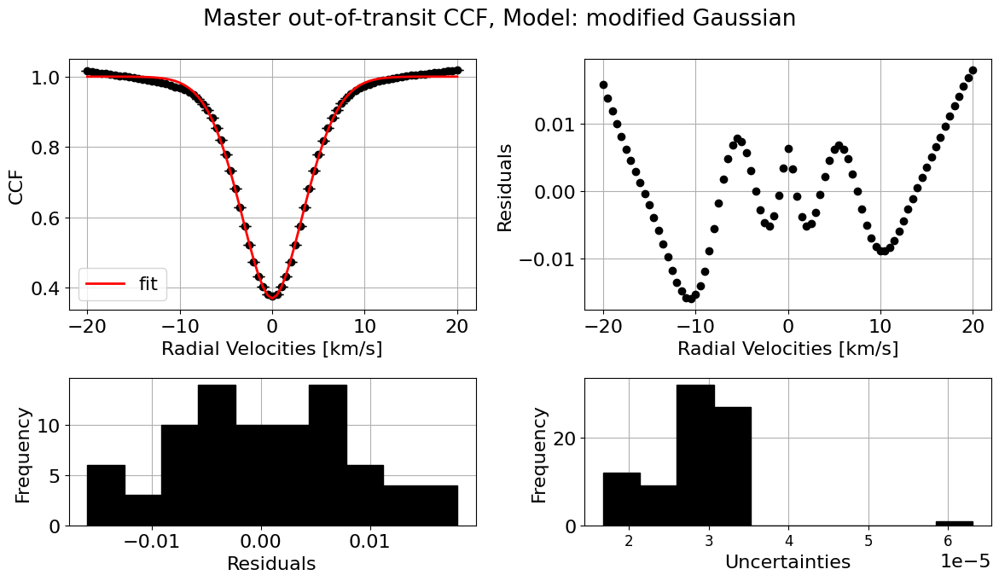

In [9]:
master_central_rv_array, master_continuum_array, master_depth_array, master_width_array, master_R2_array = hecate._CCF_parameters(CCFs=avg_out_of_transit_CCF, ccf_type="master", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.016
------------------------------
Fit parameters:
y0 = 0.113139 ± 44.195543
x0 = -4.338652 ± 0.240471
sigma = 7.414998 ± 147568.054035
a = 0.186217 ± 72.933080
c = 0.001353 ± 0.531268
R^2:  0.2665
------------------------------
CCF parameters:
Central RV [km/s]: -4.338652 ± 0.240471
Continuum: 0.113139 ± 44.195543
Deph [%]: -64.591373 ± 91045.358768
Width [km/s]: 7.414998 ± 147568.054035


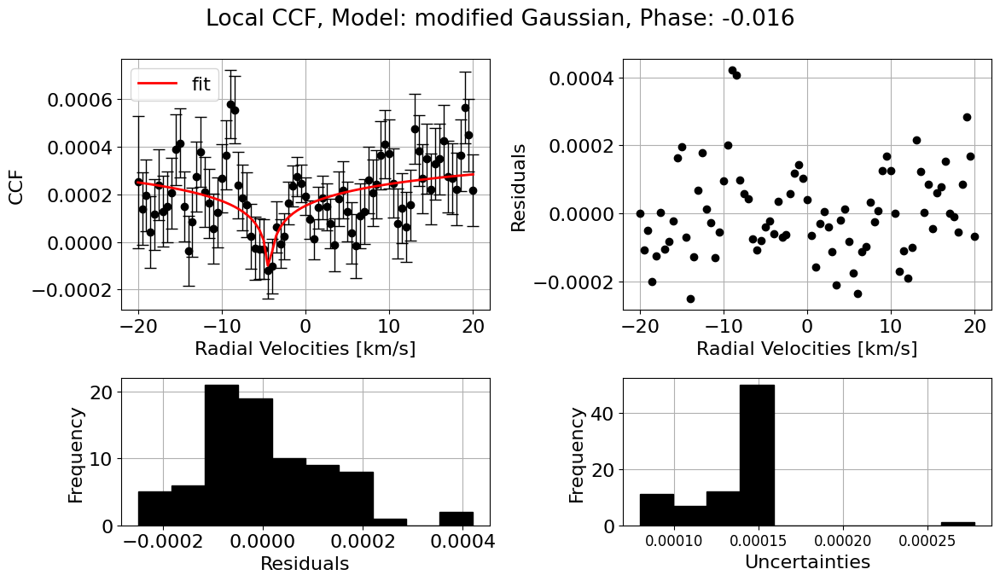

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.014
------------------------------
Fit parameters:
y0 = 0.003867 ± 0.000021
x0 = -2.268215 ± 0.055078
sigma = 3.326782 ± 0.097810
a = 0.002474 ± 0.000049
c = 2.015575 ± 0.111704
R^2:  0.9736
------------------------------
CCF parameters:
Central RV [km/s]: -2.268215 ± 0.055078
Continuum: 0.003867 ± 0.000021
Deph [%]: 36.038638 ± 1.317459
Width [km/s]: 3.326782 ± 0.097810


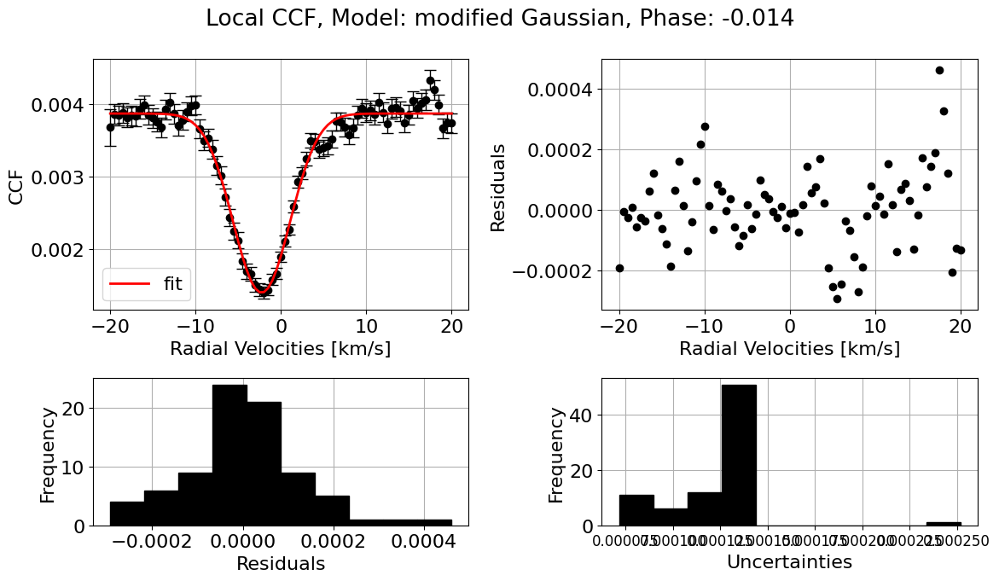

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.012
------------------------------
Fit parameters:
y0 = 0.009632 ± 0.000021
x0 = -2.045429 ± 0.020937
sigma = 3.172308 ± 0.038179
a = 0.006345 ± 0.000050
c = 1.905019 ± 0.040748
R^2:  0.9932
------------------------------
CCF parameters:
Central RV [km/s]: -2.045429 ± 0.020937
Continuum: 0.009632 ± 0.000021
Deph [%]: 34.122257 ± 0.537660
Width [km/s]: 3.172308 ± 0.038179


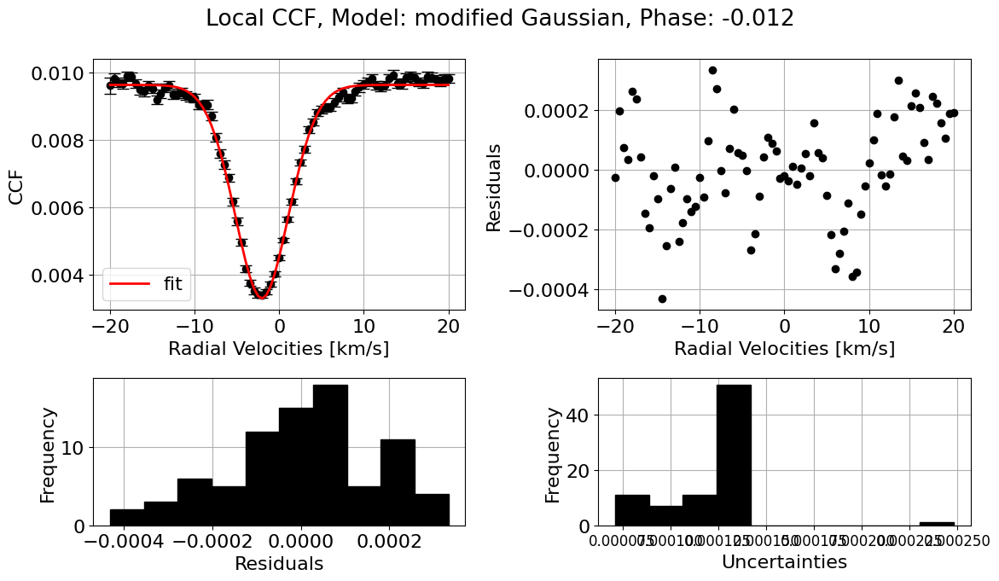

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.010
------------------------------
Fit parameters:
y0 = 0.015935 ± 0.000020
x0 = -1.842207 ± 0.012078
sigma = 3.126186 ± 0.021549
a = 0.010664 ± 0.000049
c = 1.983186 ± 0.025414
R^2:  0.9959
------------------------------
CCF parameters:
Central RV [km/s]: -1.842207 ± 0.012078
Continuum: 0.015935 ± 0.000020
Deph [%]: 33.079699 ± 0.316021
Width [km/s]: 3.126186 ± 0.021549


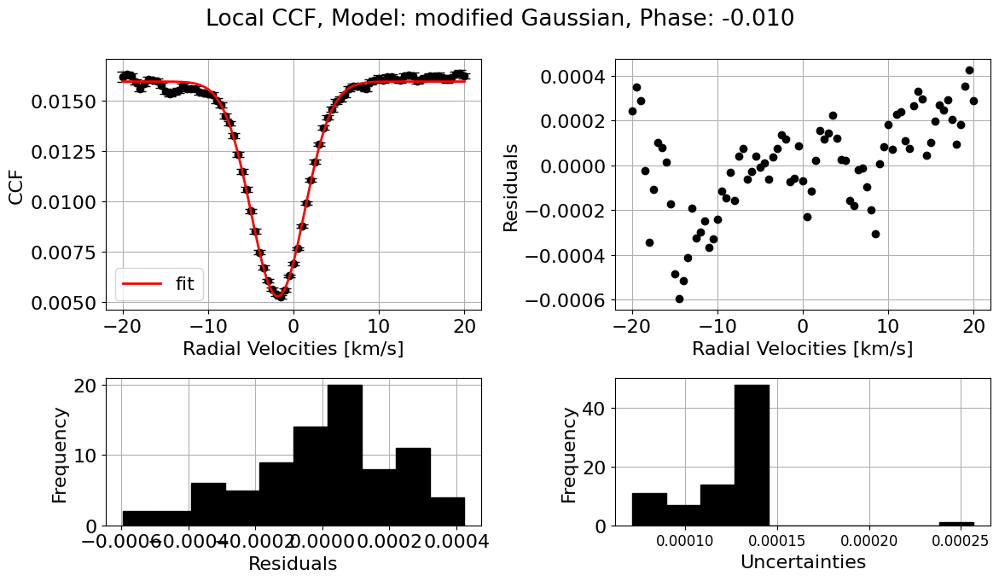

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.009
------------------------------
Fit parameters:
y0 = 0.021224 ± 0.000021
x0 = -1.493280 ± 0.009384
sigma = 3.155509 ± 0.016977
a = 0.014290 ± 0.000050
c = 1.907843 ± 0.018491
R^2:  0.9966
------------------------------
CCF parameters:
Central RV [km/s]: -1.493280 ± 0.009384
Continuum: 0.021224 ± 0.000021
Deph [%]: 32.672316 ± 0.243063
Width [km/s]: 3.155509 ± 0.016977


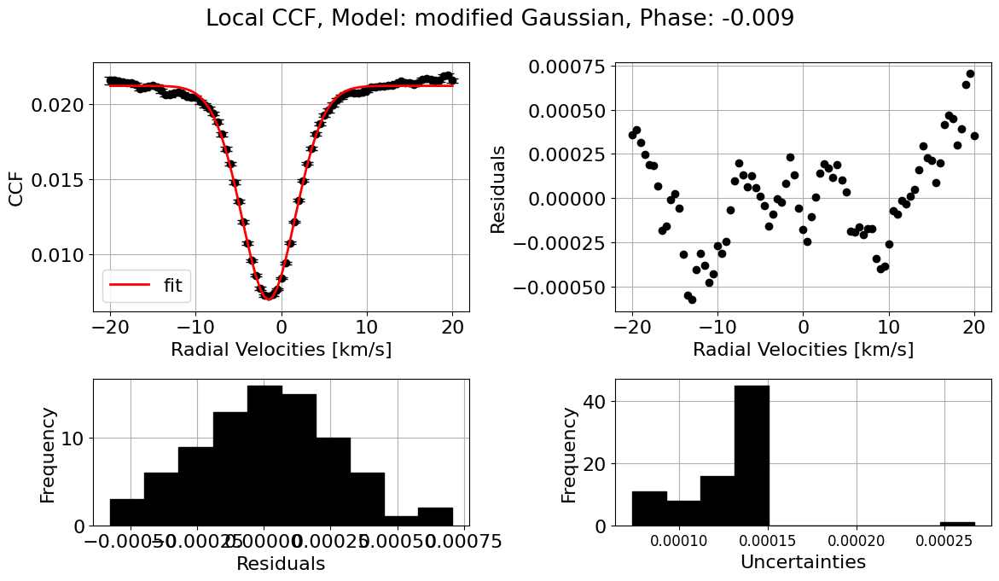

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.007
------------------------------
Fit parameters:
y0 = 0.023734 ± 0.000021
x0 = -1.125119 ± 0.008196
sigma = 3.213837 ± 0.014894
a = 0.016056 ± 0.000048
c = 1.881489 ± 0.015602
R^2:  0.9971
------------------------------
CCF parameters:
Central RV [km/s]: -1.125119 ± 0.008196
Continuum: 0.023734 ± 0.000021
Deph [%]: 32.352197 ± 0.208813
Width [km/s]: 3.213837 ± 0.014894


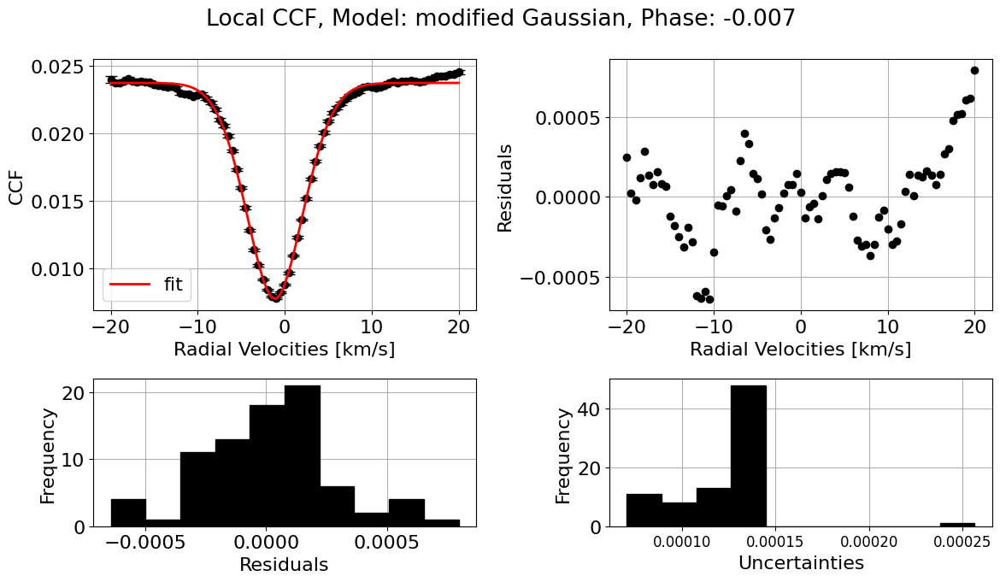

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.005
------------------------------
Fit parameters:
y0 = 0.025190 ± 0.000019
x0 = -0.805492 ± 0.006970
sigma = 3.200672 ± 0.012607
a = 0.017262 ± 0.000043
c = 1.889739 ± 0.013449
R^2:  0.9973
------------------------------
CCF parameters:
Central RV [km/s]: -0.805492 ± 0.006970
Continuum: 0.025190 ± 0.000019
Deph [%]: 31.470738 ± 0.179146
Width [km/s]: 3.200672 ± 0.012607


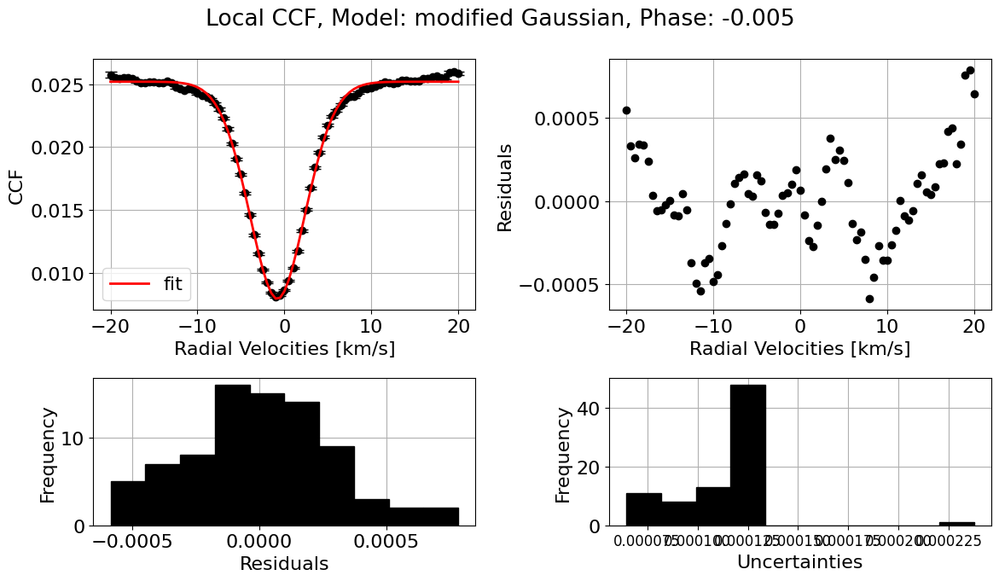

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.003
------------------------------
Fit parameters:
y0 = 0.025936 ± 0.000019
x0 = -0.549744 ± 0.006405
sigma = 3.156259 ± 0.011475
a = 0.018022 ± 0.000042
c = 1.919715 ± 0.012826
R^2:  0.9974
------------------------------
CCF parameters:
Central RV [km/s]: -0.549744 ± 0.006405
Continuum: 0.025936 ± 0.000019
Deph [%]: 30.513345 ± 0.168098
Width [km/s]: 3.156259 ± 0.011475


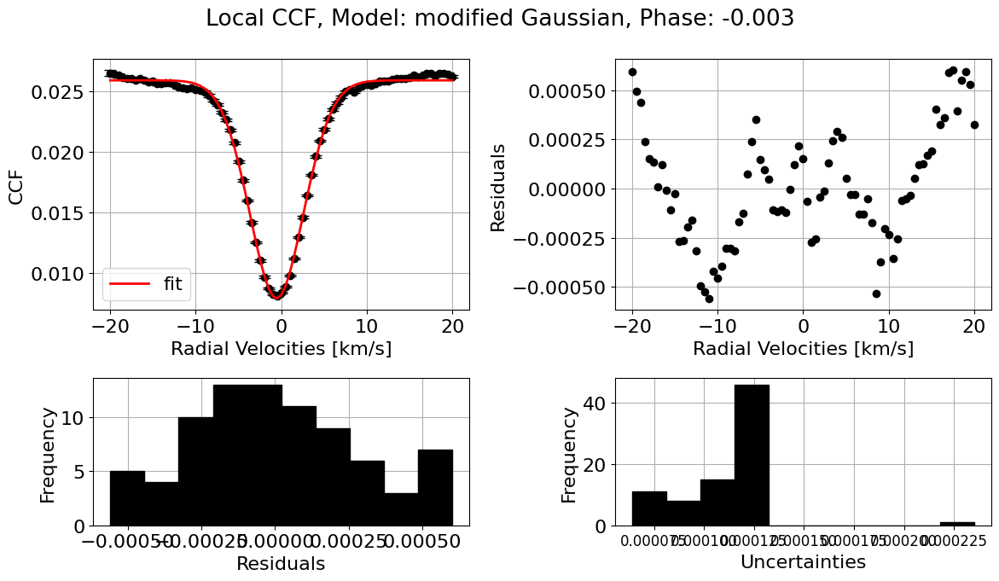

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.001
------------------------------
Fit parameters:
y0 = 0.026623 ± 0.000019
x0 = -0.254559 ± 0.006206
sigma = 3.122070 ± 0.011257
a = 0.018672 ± 0.000042
c = 1.889155 ± 0.012307
R^2:  0.9968
------------------------------
CCF parameters:
Central RV [km/s]: -0.254559 ± 0.006206
Continuum: 0.026623 ± 0.000019
Deph [%]: 29.867883 ± 0.167000
Width [km/s]: 3.122070 ± 0.011257


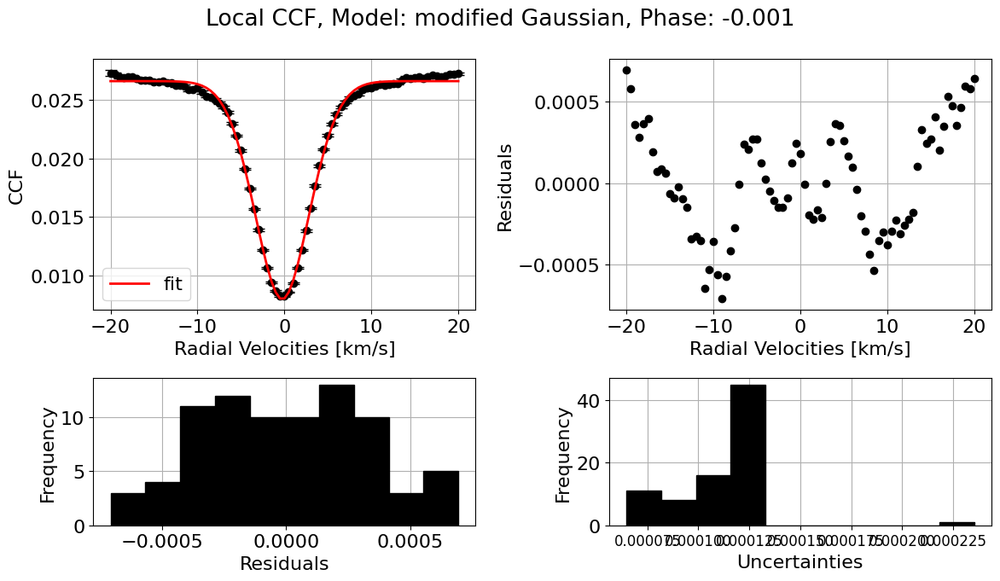

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0003
------------------------------
Fit parameters:
y0 = 0.026743 ± 0.000020
x0 = 0.055091 ± 0.006551
sigma = 3.131050 ± 0.011783
a = 0.018708 ± 0.000044
c = 1.901427 ± 0.013008
R^2:  0.9971
------------------------------
CCF parameters:
Central RV [km/s]: 0.055091 ± 0.006551
Continuum: 0.026743 ± 0.000020
Deph [%]: 30.045643 ± 0.173713
Width [km/s]: 3.131050 ± 0.011783


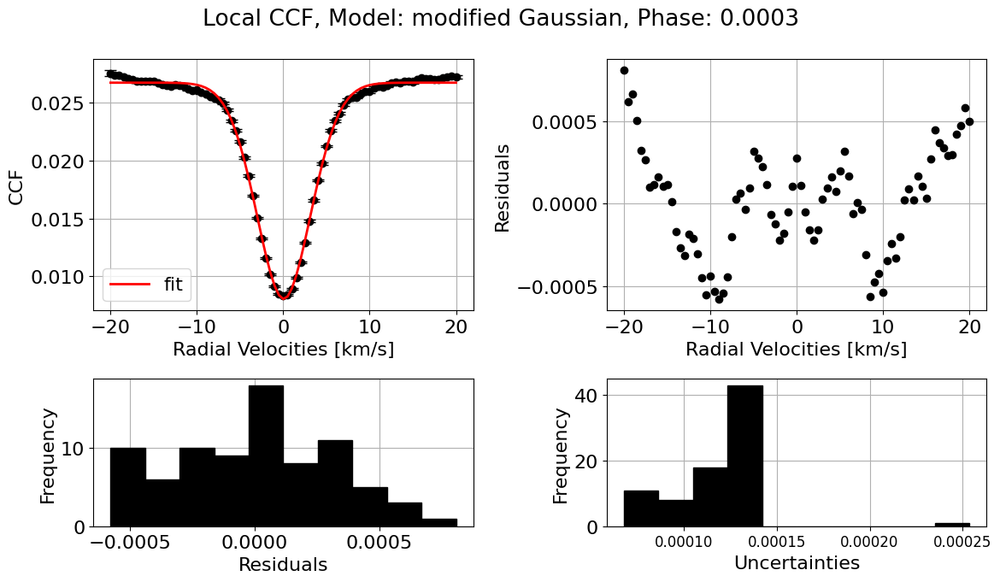

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0022
------------------------------
Fit parameters:
y0 = 0.026436 ± 0.000020
x0 = 0.376375 ± 0.006546
sigma = 3.092150 ± 0.011952
a = 0.018516 ± 0.000045
c = 1.869588 ± 0.012859
R^2:  0.9969
------------------------------
CCF parameters:
Central RV [km/s]: 0.376375 ± 0.006546
Continuum: 0.026436 ± 0.000020
Deph [%]: 29.958325 ± 0.177361
Width [km/s]: 3.092150 ± 0.011952


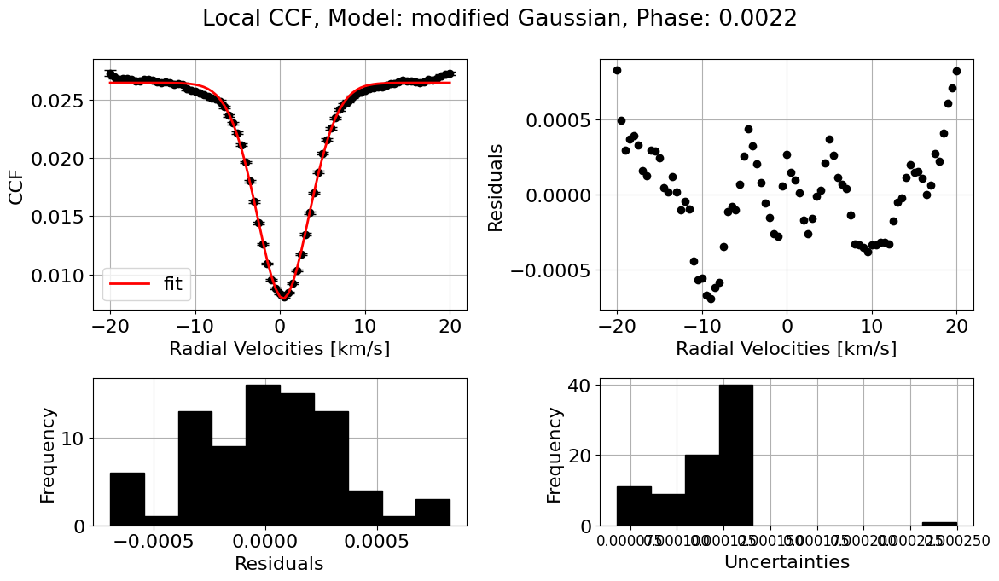

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0041
------------------------------
Fit parameters:
y0 = 0.025592 ± 0.000019
x0 = 0.688793 ± 0.006772
sigma = 3.124931 ± 0.012195
a = 0.017815 ± 0.000044
c = 1.912726 ± 0.013625
R^2:  0.997
------------------------------
CCF parameters:
Central RV [km/s]: 0.688793 ± 0.006772
Continuum: 0.025592 ± 0.000019
Deph [%]: 30.386193 ± 0.180704
Width [km/s]: 3.124931 ± 0.012195


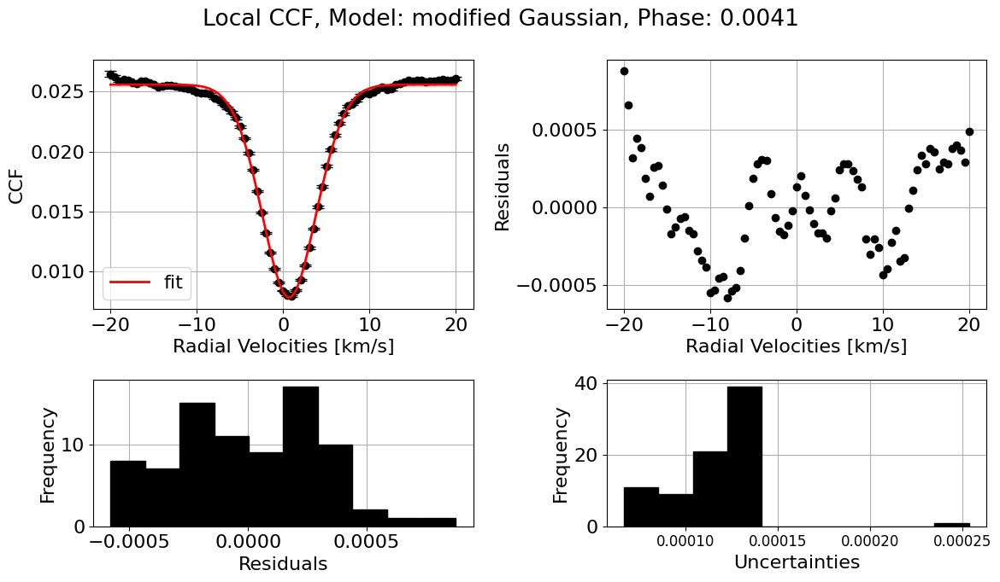

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0060
------------------------------
Fit parameters:
y0 = 0.024672 ± 0.000020
x0 = 1.005732 ± 0.007468
sigma = 3.122169 ± 0.013479
a = 0.016973 ± 0.000047
c = 1.897289 ± 0.014738
R^2:  0.9968
------------------------------
CCF parameters:
Central RV [km/s]: 1.005732 ± 0.007468
Continuum: 0.024672 ± 0.000020
Deph [%]: 31.205436 ± 0.197064
Width [km/s]: 3.122169 ± 0.013479


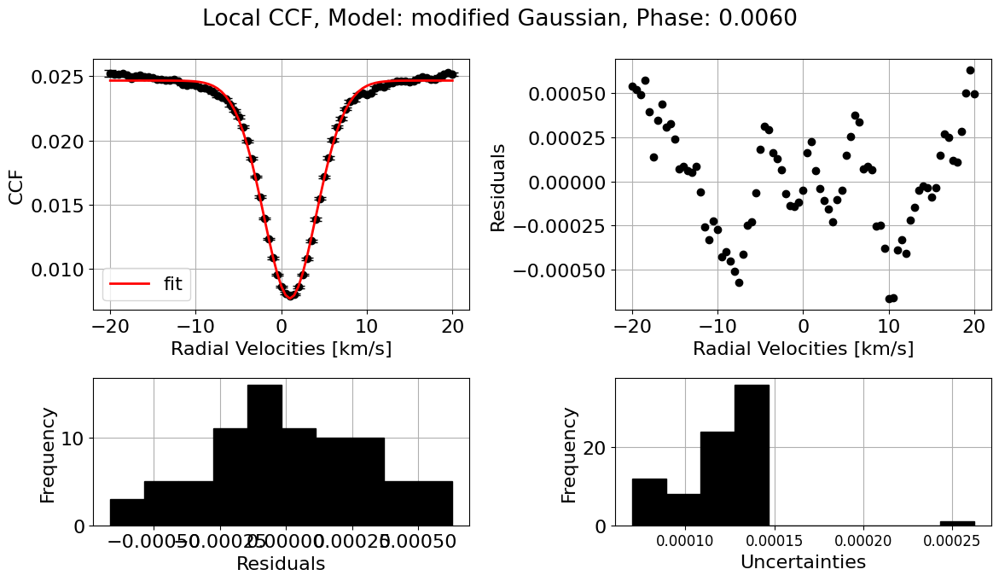

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0078
------------------------------
Fit parameters:
y0 = 0.022914 ± 0.000022
x0 = 1.315850 ± 0.008914
sigma = 3.108960 ± 0.016277
a = 0.015480 ± 0.000052
c = 1.891123 ± 0.017652
R^2:  0.9958
------------------------------
CCF parameters:
Central RV [km/s]: 1.315850 ± 0.008914
Continuum: 0.022914 ± 0.000022
Deph [%]: 32.444952 ± 0.235847
Width [km/s]: 3.108960 ± 0.016277


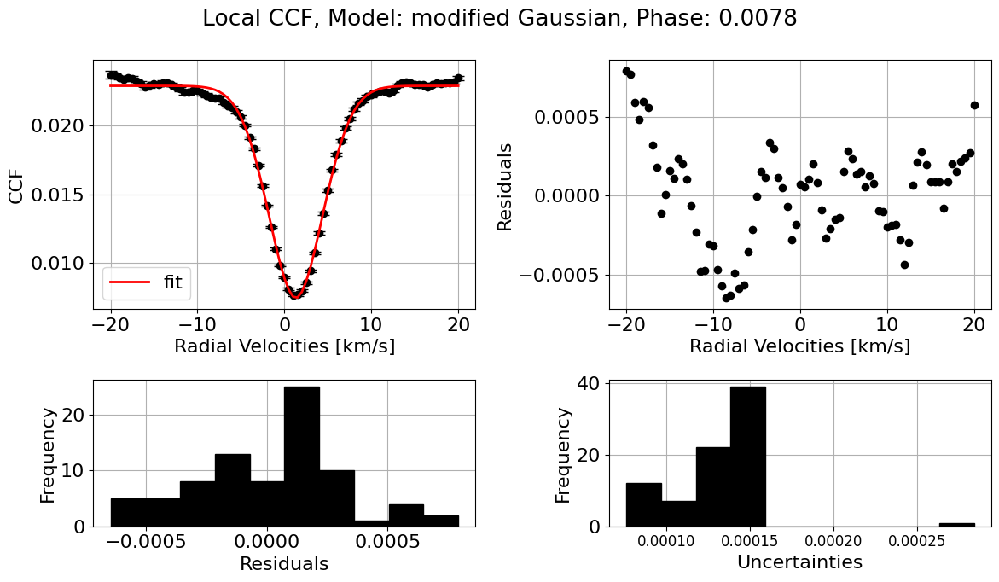

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0097
------------------------------
Fit parameters:
y0 = 0.019365 ± 0.000024
x0 = 1.678301 ± 0.011857
sigma = 3.125092 ± 0.021824
a = 0.012901 ± 0.000058
c = 1.877342 ± 0.023012
R^2:  0.997
------------------------------
CCF parameters:
Central RV [km/s]: 1.678301 ± 0.011857
Continuum: 0.019365 ± 0.000024
Deph [%]: 33.379035 ± 0.310487
Width [km/s]: 3.125092 ± 0.021824


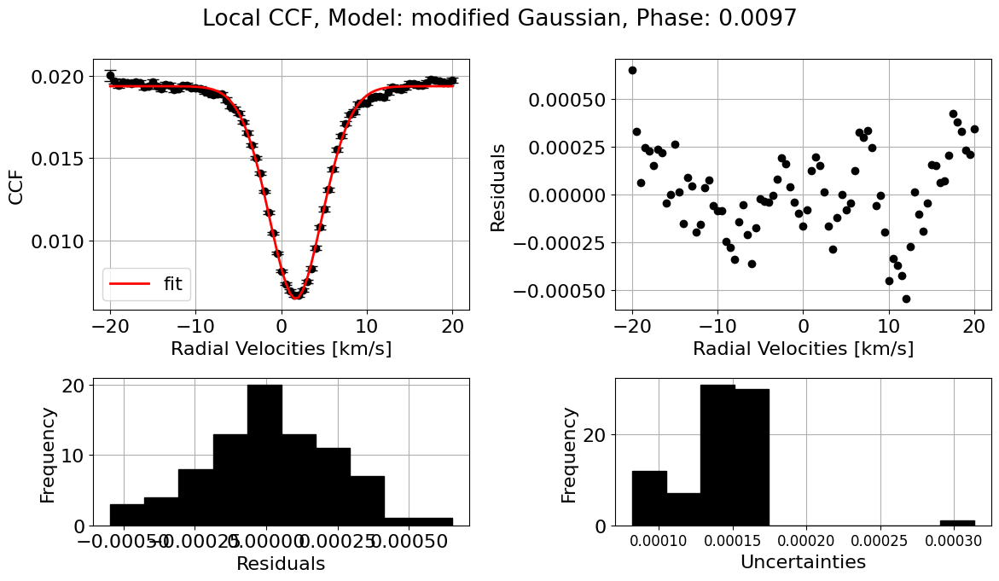

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0116
------------------------------
Fit parameters:
y0 = 0.013646 ± 0.000025
x0 = 1.909798 ± 0.018368
sigma = 3.199899 ± 0.032385
a = 0.008756 ± 0.000059
c = 2.028527 ± 0.038971
R^2:  0.9952
------------------------------
CCF parameters:
Central RV [km/s]: 1.909798 ± 0.018368
Continuum: 0.013646 ± 0.000025
Deph [%]: 35.837601 ± 0.449612
Width [km/s]: 3.199899 ± 0.032385


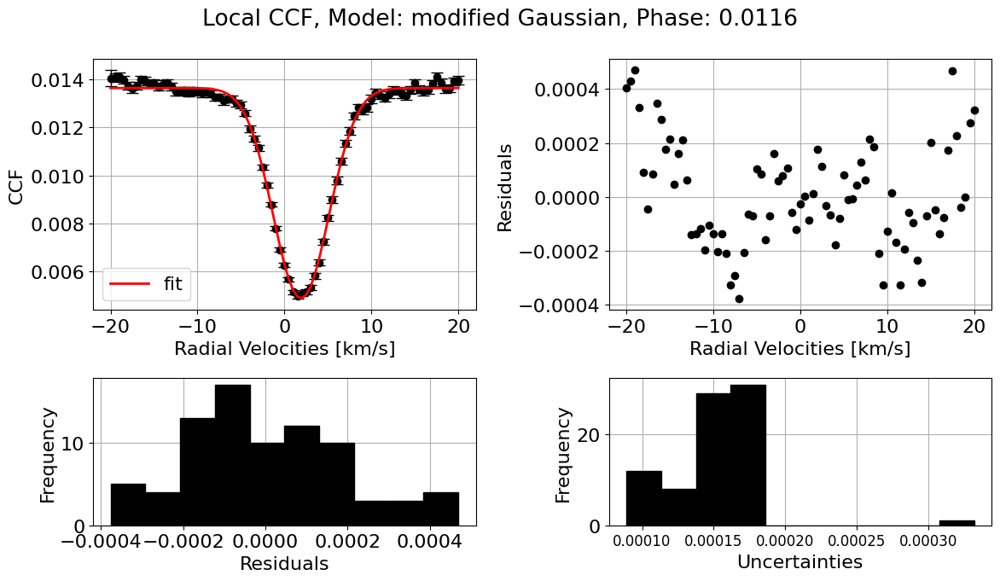

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0135
------------------------------
Fit parameters:
y0 = 0.007036 ± 0.000023
x0 = 2.192125 ± 0.035026
sigma = 3.262965 ± 0.059461
a = 0.004281 ± 0.000055
c = 2.226954 ± 0.084595
R^2:  0.9867
------------------------------
CCF parameters:
Central RV [km/s]: 2.192125 ± 0.035026
Continuum: 0.007036 ± 0.000023
Deph [%]: 39.156289 ± 0.807939
Width [km/s]: 3.262965 ± 0.059461


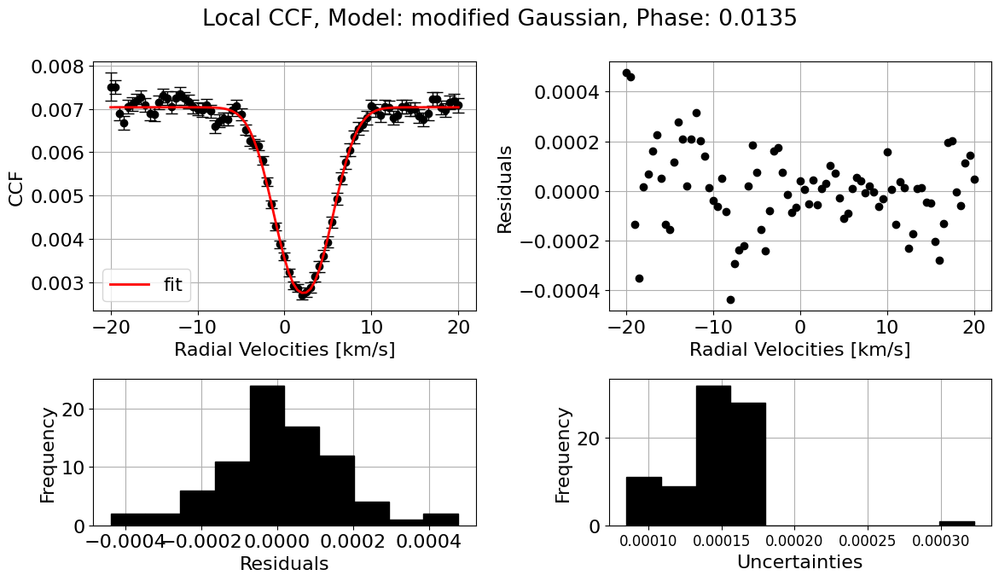

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0154
------------------------------
Fit parameters:
y0 = 0.002050 ± 0.000020
x0 = 2.290838 ± 0.103166
sigma = 3.252011 ± 0.164538
a = 0.001242 ± 0.000048
c = 2.620692 ± 0.327435
R^2:  0.9107
------------------------------
CCF parameters:
Central RV [km/s]: 2.290838 ± 0.103166
Continuum: 0.002050 ± 0.000020
Deph [%]: 39.389711 ± 2.428580
Width [km/s]: 3.252011 ± 0.164538


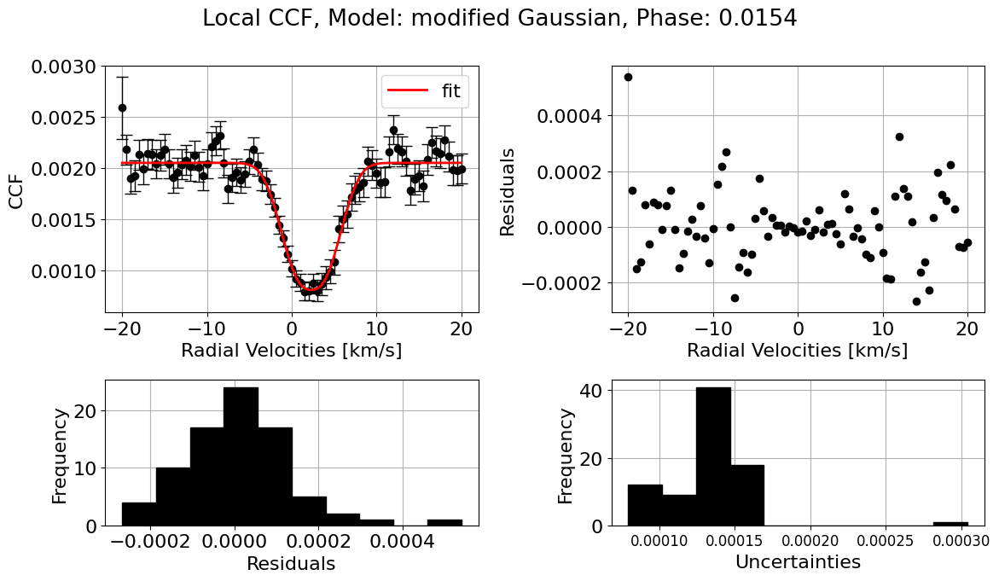

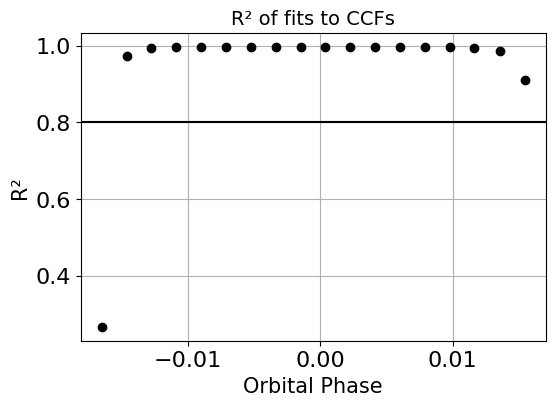

In [10]:
central_rv_array, continuum_array, depth_array, width_array, R2_array = hecate._CCF_parameters(CCFs=local_CCFs, ccf_type="local", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

In [11]:
phase_mu = get_phase_mu(planet_params, time)
phases, tr_dur, tr_ingress_egress, in_indices, out_indices = phase_mu.phases, phase_mu.tr_dur, phase_mu.tr_ingress_egress, phase_mu.in_indices, phase_mu.out_indices
in_phases = phases[np.isin(np.arange(len(phases)), in_indices)]

mu_in = get_phase_mu.mu(in_phases, planet_params)
indices_final = np.arange(2,len(mu_in)-2)

mu_min = get_phase_mu.mu(tr_dur/2-tr_ingress_egress/2, planet_params)
mu_max = get_phase_mu.mu(0, planet_params)

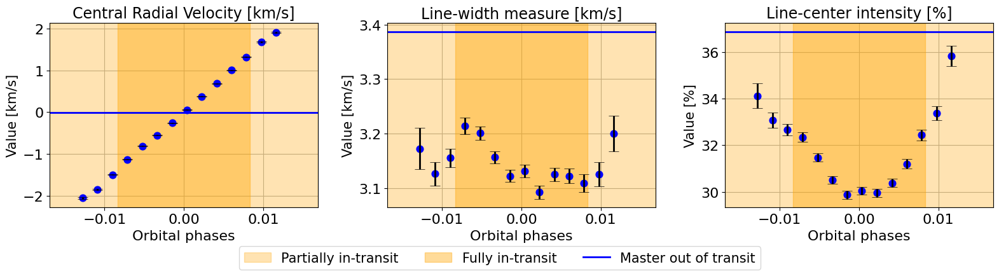

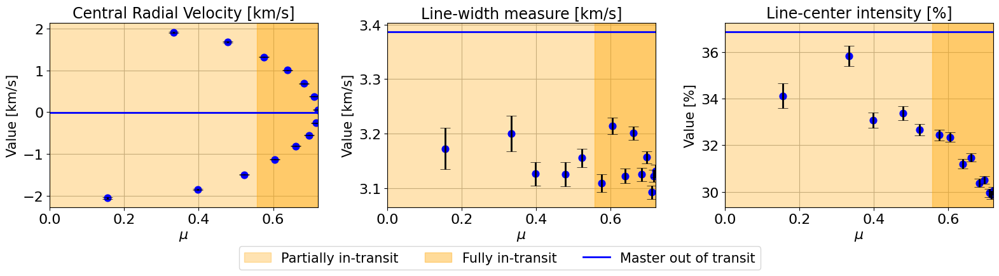

In [12]:
local_params = [central_rv_array, width_array, depth_array]
master_params = [master_central_rv_array, master_width_array, master_depth_array]

hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=False, plot_nested=False, save=None)

Central Radial Velocity [km/s]
----------------------------------------
Orbital phases


19036it [00:12, 1464.40it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 392683 | eff(%):  4.716 | loglstar: 38.851 < 44.081 < 43.442 | logz: 27.542 +/-  0.111 | stop:  0.913]             
14340it [00:11, 1277.68it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 272628 | eff(%):  5.065 | loglstar: -16.542 < -10.792 < -11.373 | logz: -17.622 +/-  0.067 | stop:  0.933]        


------------------------------
Linear vs Constant
logZ(linear)   = 27.546 ± 0.102
logZ(constant) = -17.659 ± 0.061
log Bayes factor = 45.206
Unconstrained model favored.
------------------------------


18946it [00:13, 1419.40it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 390148 | eff(%):  4.723 | loglstar: 38.639 < 44.070 < 43.503 | logz: 28.299 +/-  0.107 | stop:  0.900]            
3636it [00:01, 2085.71it/s, batch: 0 | bound: 4 | nc: 23 | ncall: 59598 | eff(%):  6.050 | loglstar:   -inf < -16.468 <    inf | logz: -24.338 +/-  0.114 | dlogz:  6.719 >  0.010]


KeyboardInterrupt: 

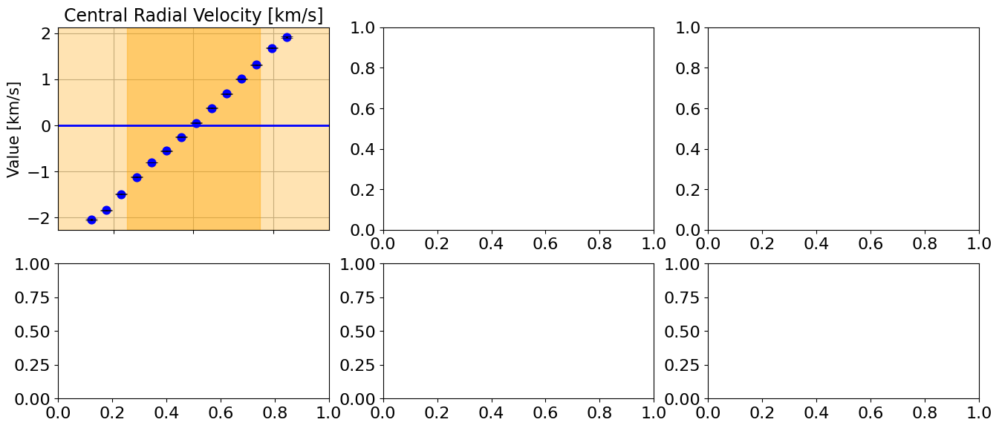

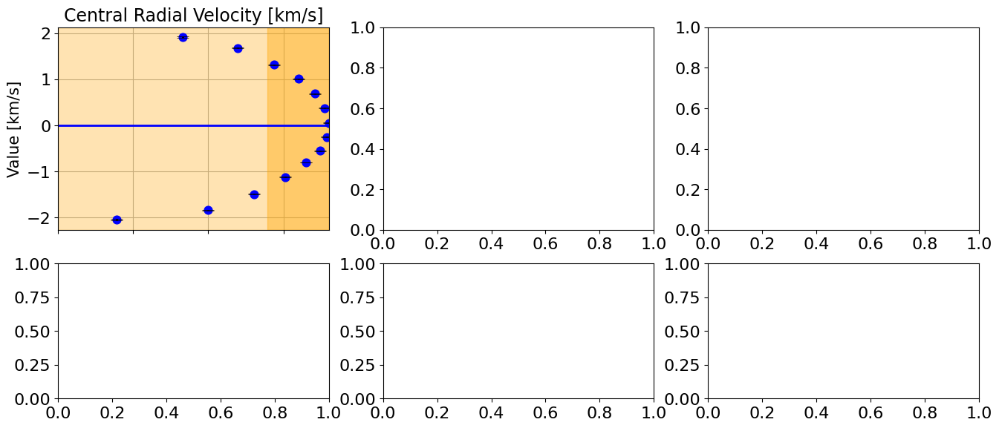

In [13]:
hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=True, plot_nested=False, save=None)

# Strong Fe I lines

In [26]:
from get_data import *

spectra, time, airmass, berv, bervmax, snr, list_spectra = get_spectra(day='2021-08-31')
CCFs, _, _, _, _, _, _ = get_CCFs(planet_params, day= '2021-08-31', plot=False)

In [27]:
mask = np.array([4365.9004, 5250.6527, 6027.0562,
4432.5726, 5253.4693, 6056.0114, 4445.4760, 5365.4063, 6065.4921,
4523.4015, 5367.4755, 6151.6217, 4574.2191, 5369.9702, 6157.7331,
4602.0006, 5373.7136, 6173.3433, 4678.8519, 5379.5796, 6180.2084,
4741.5341, 5389.4866, 6200.3204, 4839.5500, 5432.9525, 6213.4375,
4874.3565, 5445.0502, 6219.2886, 4875.8815, 5473.9076, 6232.6493,
4885.4361, 5525.5472, 6265.1412, 4892.8624, 5543.9399, 6270.2322,
4909.3874, 5638.2675, 6297.8013, 4918.0152, 5662.5233, 6322.6936,
4946.3941, 5701.5527, 6335.3378, 4950.1108, 5705.4677, 6408.0262,
4983.2566, 5717.8379, 6430.8538, 5044.2164, 5731.7666, 6481.8784, 
5090.7807, 5753.1287, 6498.9461, 5141.7460, 5775.0849, 6593.8798, 
5242.4988, 5916.2535, 6609.1189, 5243.7823, 5956.6997, 6750.1597, 
5250.2171, 6007.9656, 6855.1684]) #air wavelengths

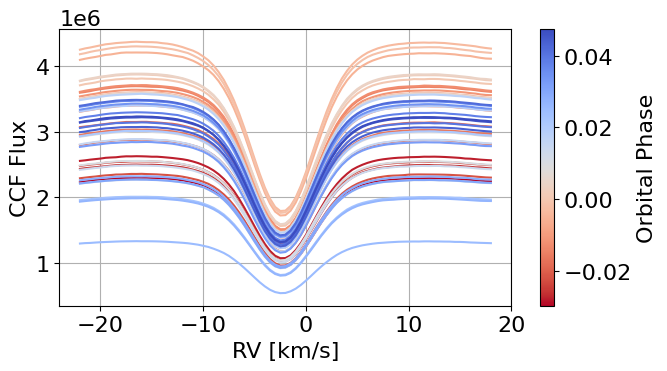

In [28]:
RV_reference = CCFs[0,2,:] #same as in white light CCF

CCFs_strong_iron = build_CCF(time, planet_params, spectra, RV_reference, mask, berv, bervmax, plot=True).CCFs

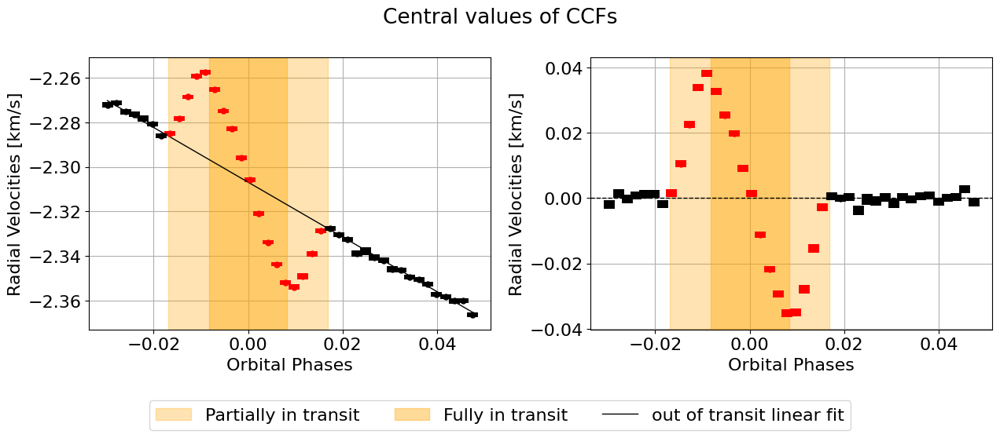

In [29]:
sysvel_corr = sysvel_correction(planet_params, time, CCFs_strong_iron, model="modified Gaussian", plot_fits=False, plot_sys_vel=True)

CCFs_sysvel_corr = sysvel_corr.CCFs_sysvel_corr
x0_corr = sysvel_corr.x0_corr

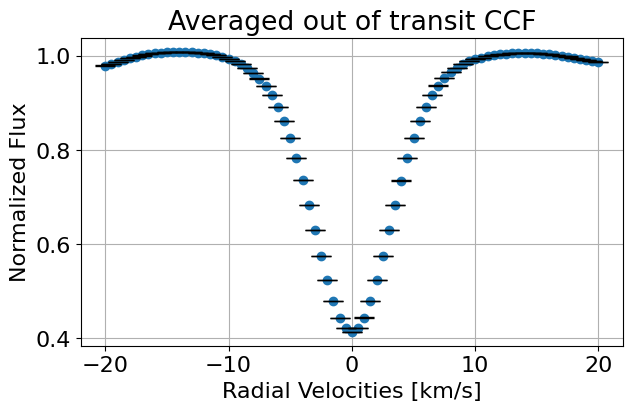

In [30]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_sysvel_corr)

RV_reference = np.arange(round(np.max(CCFs_sysvel_corr[:,2,0])), round(np.min(CCFs_sysvel_corr[:,2,-1]))+0.5, 0.5)

CCF_interp, avg_out_of_transit_CCF = hecate._avg_out_of_transit_CCF(CCFs_sysvel_corr, RV_reference, plot=True, save=None)

##############################
Fitting modified Gaussian model to master CCF
------------------------------
Fit parameters:
y0 = 1.000301 ± 0.000016
x0 = 0.000179 ± 0.000184
sigma = 3.130144 ± 0.000338
a = 0.589399 ± 0.000039
c = 1.873650 ± 0.000351
R^2:  0.9991
------------------------------
CCF parameters:
Central RV [km/s]: 0.000179 ± 0.000184
Continuum: 1.000301 ± 0.000016
Deph [%]: 41.077783 ± 0.004051
Width [km/s]: 3.130144 ± 0.000338


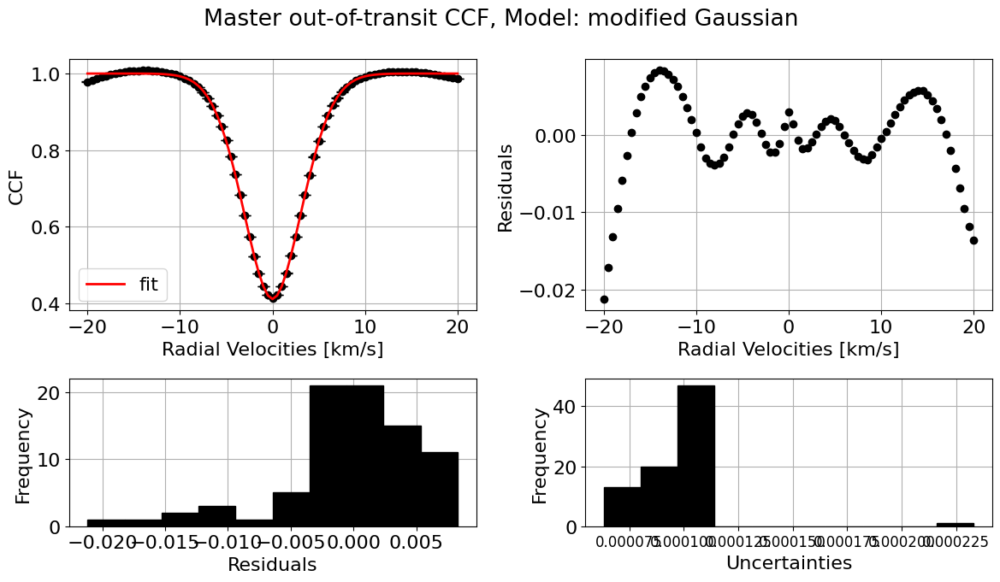

In [31]:
master_central_rv_array, master_continuum_array, master_depth_array, master_width_array, master_R2_array = hecate._CCF_parameters(CCFs=avg_out_of_transit_CCF, ccf_type="master", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

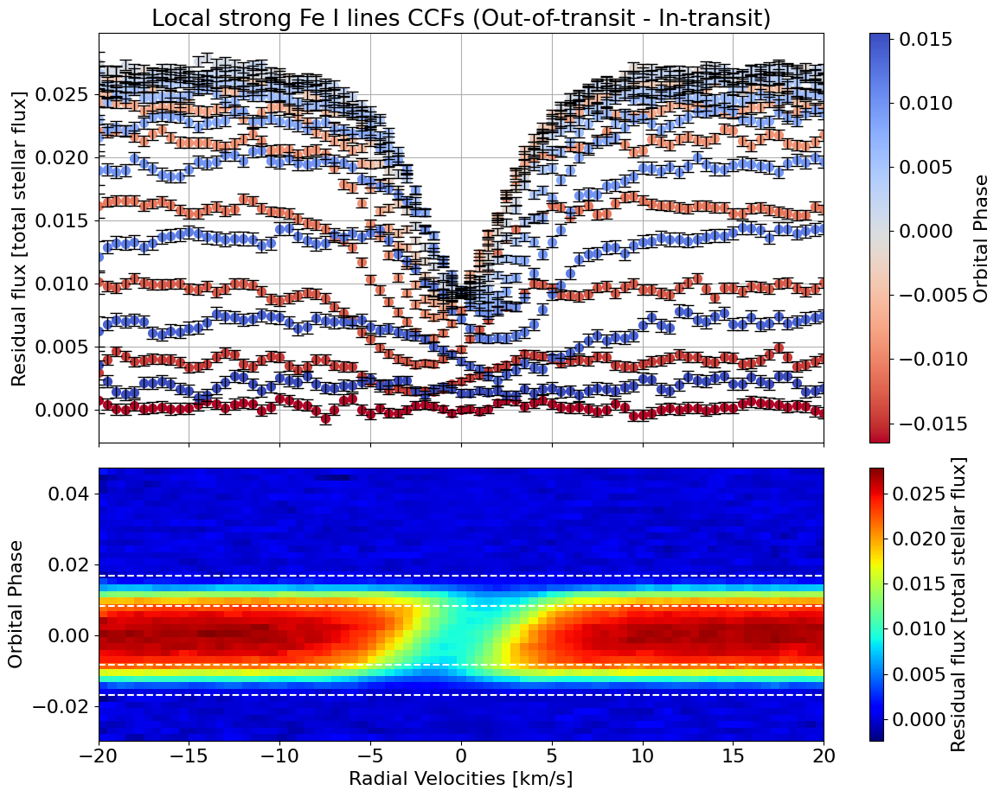

In [32]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_strong_iron)

ccf_type = "strong Fe I lines"
model_fit = "modified Gaussian"
plot = {"SOAP":False, "fits_initial_CCF":False, "sys_vel":False, "avg_out_of_transit_CCF":False, "local_CCFs":True}

local_CCFs, CCFs_sub_all, CCFs_flux_corr, phases, in_phases = hecate._extract_local_CCF(model_fit, ccf_type, plot, save=None)

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.016
------------------------------
Fit parameters:
y0 = 0.000256 ± 0.000052
x0 = -0.364119 ± 0.393614
sigma = 0.152227 ± 1.674130
a = 0.000755 ± 0.004011
c = 0.823786 ± 3.770870
R^2:  0.0379
------------------------------
CCF parameters:
Central RV [km/s]: -0.364119 ± 0.393614
Continuum: 0.000256 ± 0.000052
Deph [%]: -195.182155 ± 1569.020553
Width [km/s]: 0.152227 ± 1.674130


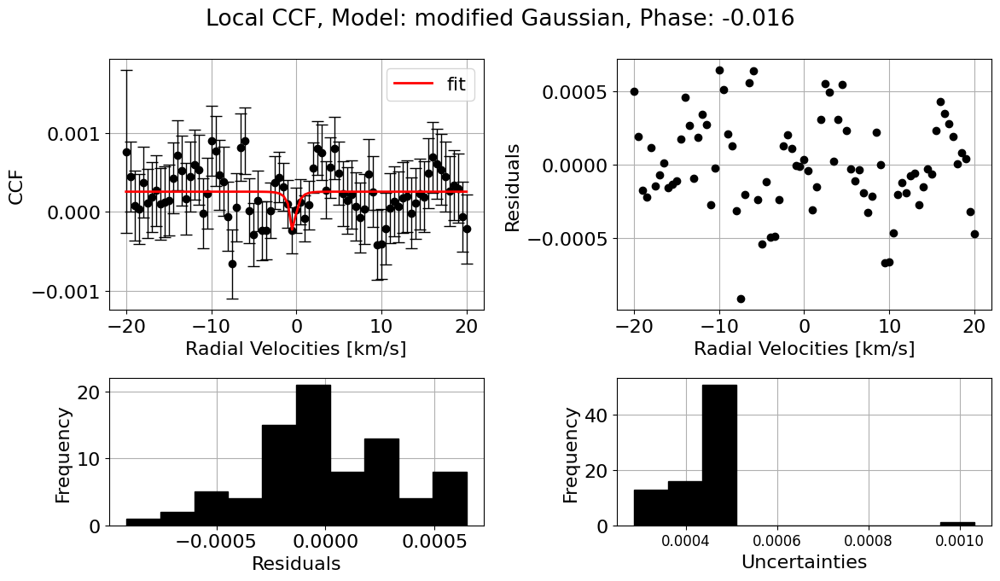

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.014
------------------------------
Fit parameters:
y0 = 0.003967 ± 0.000054
x0 = -2.354611 ± 0.142998
sigma = 2.781558 ± 0.233583
a = 0.002457 ± 0.000157
c = 2.659274 ± 0.548094
R^2:  0.8445
------------------------------
CCF parameters:
Central RV [km/s]: -2.354611 ± 0.142998
Continuum: 0.003967 ± 0.000054
Deph [%]: 38.046856 ± 4.047296
Width [km/s]: 2.781558 ± 0.233583


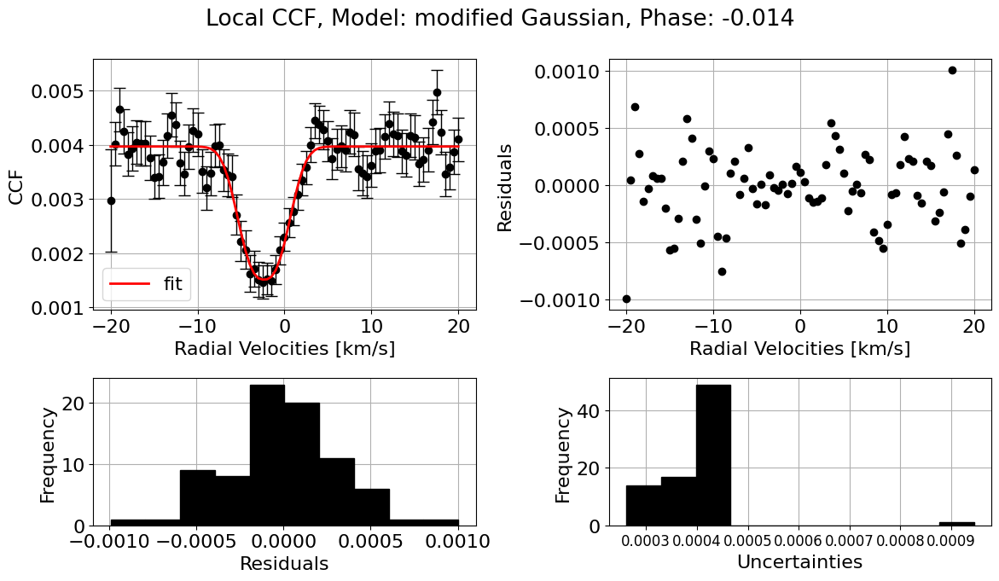

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.012
------------------------------
Fit parameters:
y0 = 0.009656 ± 0.000057
x0 = -2.264273 ± 0.065068
sigma = 3.013824 ± 0.111218
a = 0.006017 ± 0.000159
c = 2.348754 ± 0.187054
R^2:  0.9684
------------------------------
CCF parameters:
Central RV [km/s]: -2.264273 ± 0.065068
Continuum: 0.009656 ± 0.000057
Deph [%]: 37.684441 ± 1.687935
Width [km/s]: 3.013824 ± 0.111218


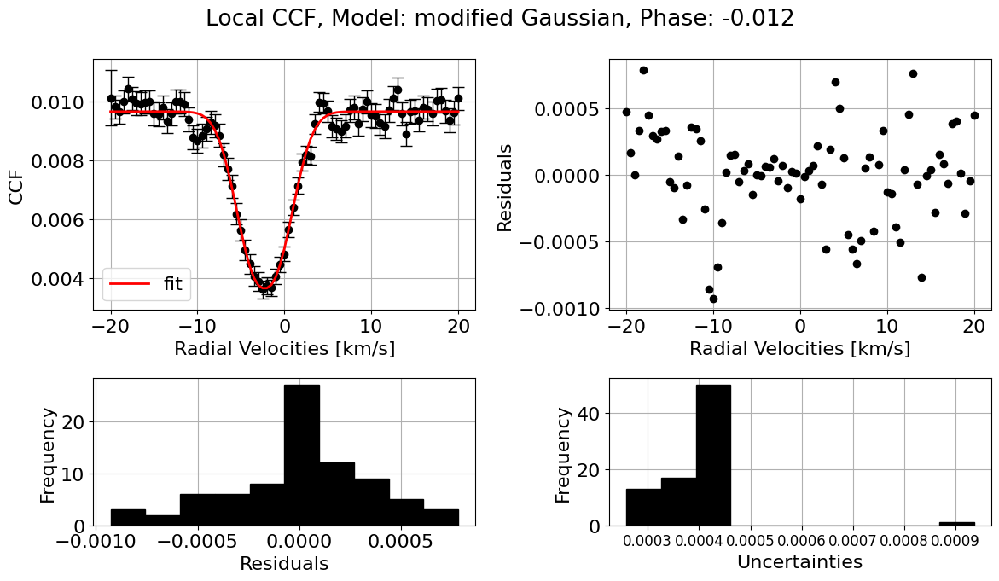

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.010
------------------------------
Fit parameters:
y0 = 0.016046 ± 0.000059
x0 = -1.898160 ± 0.038929
sigma = 2.688812 ± 0.072468
a = 0.010387 ± 0.000178
c = 1.917067 ± 0.088918
R^2:  0.9867
------------------------------
CCF parameters:
Central RV [km/s]: -1.898160 ± 0.038929
Continuum: 0.016046 ± 0.000059
Deph [%]: 35.268306 ± 1.133540
Width [km/s]: 2.688812 ± 0.072468


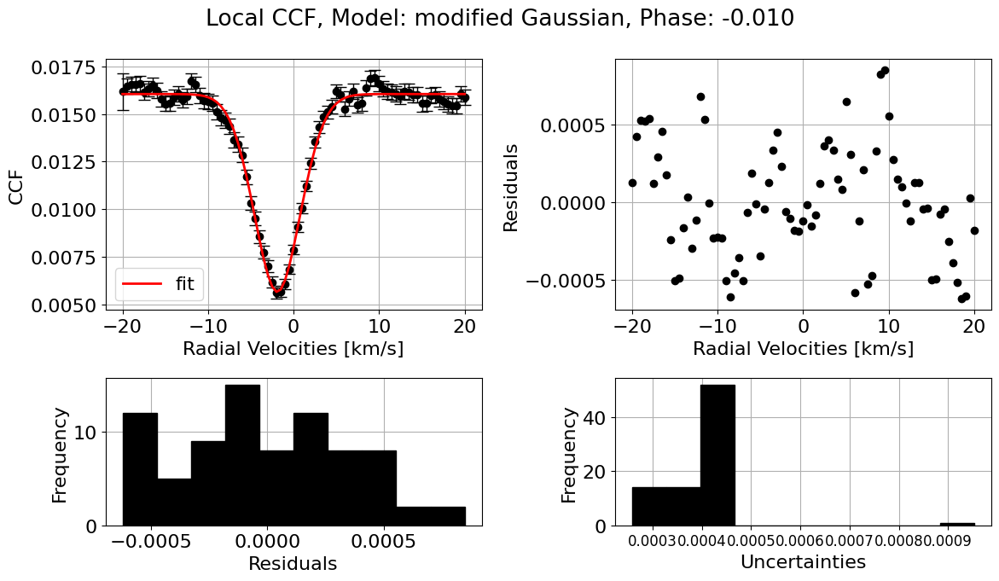

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.008
------------------------------
Fit parameters:
y0 = 0.021349 ± 0.000061
x0 = -1.530517 ± 0.029438
sigma = 2.710207 ± 0.054756
a = 0.014111 ± 0.000180
c = 1.906384 ± 0.066463
R^2:  0.9916
------------------------------
CCF parameters:
Central RV [km/s]: -1.530517 ± 0.029438
Continuum: 0.021349 ± 0.000061
Deph [%]: 33.900898 ± 0.861821
Width [km/s]: 2.710207 ± 0.054756


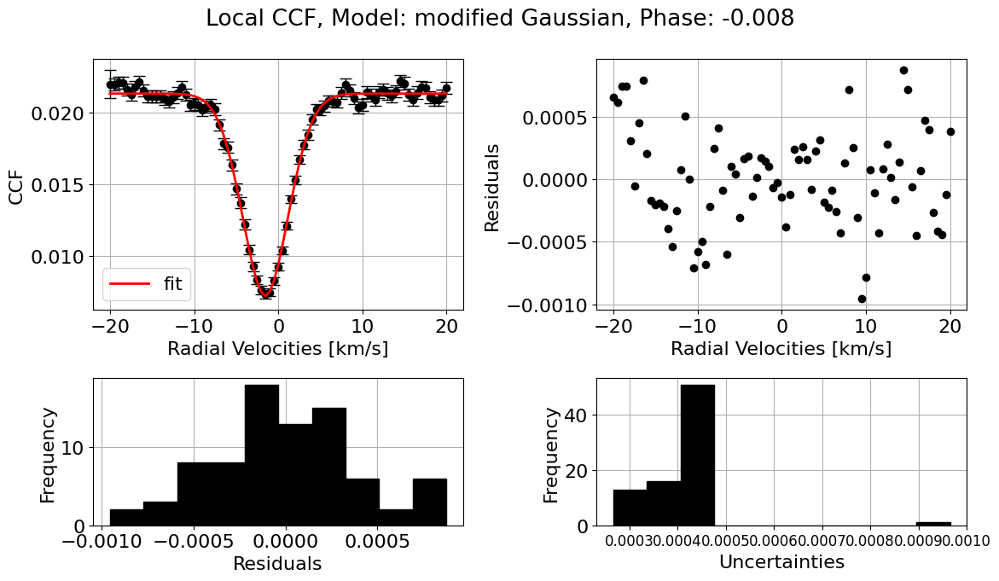

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.007
------------------------------
Fit parameters:
y0 = 0.023821 ± 0.000060
x0 = -1.147489 ± 0.026071
sigma = 2.767458 ± 0.048839
a = 0.015768 ± 0.000172
c = 1.869029 ± 0.056088
R^2:  0.9949
------------------------------
CCF parameters:
Central RV [km/s]: -1.147489 ± 0.026071
Continuum: 0.023821 ± 0.000060
Deph [%]: 33.806924 ± 0.742434
Width [km/s]: 2.767458 ± 0.048839


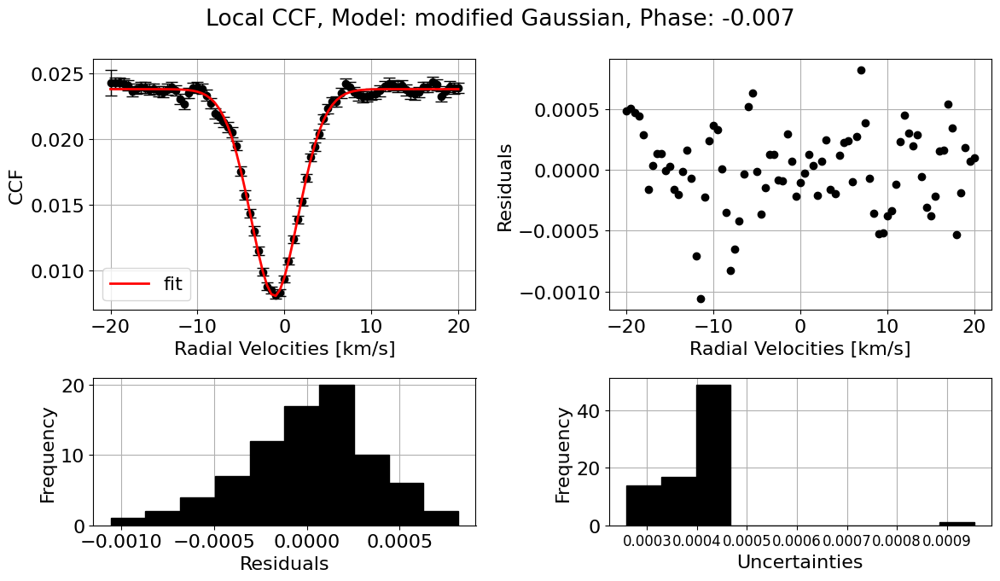

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.005
------------------------------
Fit parameters:
y0 = 0.025276 ± 0.000058
x0 = -0.856225 ± 0.023641
sigma = 2.866901 ± 0.044618
a = 0.016624 ± 0.000159
c = 1.827216 ± 0.047524
R^2:  0.9937
------------------------------
CCF parameters:
Central RV [km/s]: -0.856225 ± 0.023641
Continuum: 0.025276 ± 0.000058
Deph [%]: 34.230066 ± 0.645450
Width [km/s]: 2.866901 ± 0.044618


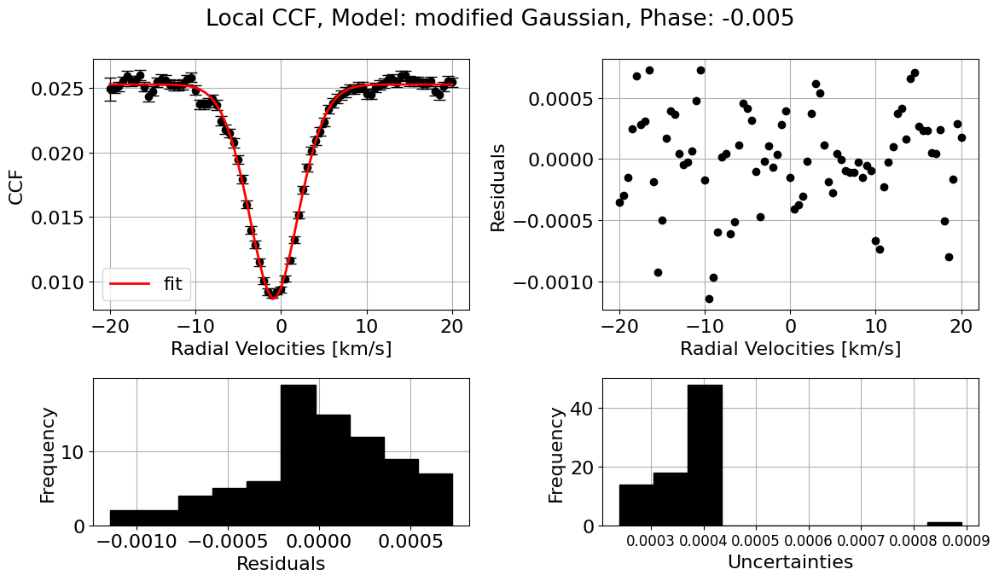

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.003
------------------------------
Fit parameters:
y0 = 0.026009 ± 0.000055
x0 = -0.603560 ± 0.021050
sigma = 2.696290 ± 0.039659
a = 0.017565 ± 0.000157
c = 1.835449 ± 0.045189
R^2:  0.9959
------------------------------
CCF parameters:
Central RV [km/s]: -0.603560 ± 0.021050
Continuum: 0.026009 ± 0.000055
Deph [%]: 32.465152 ± 0.620545
Width [km/s]: 2.696290 ± 0.039659


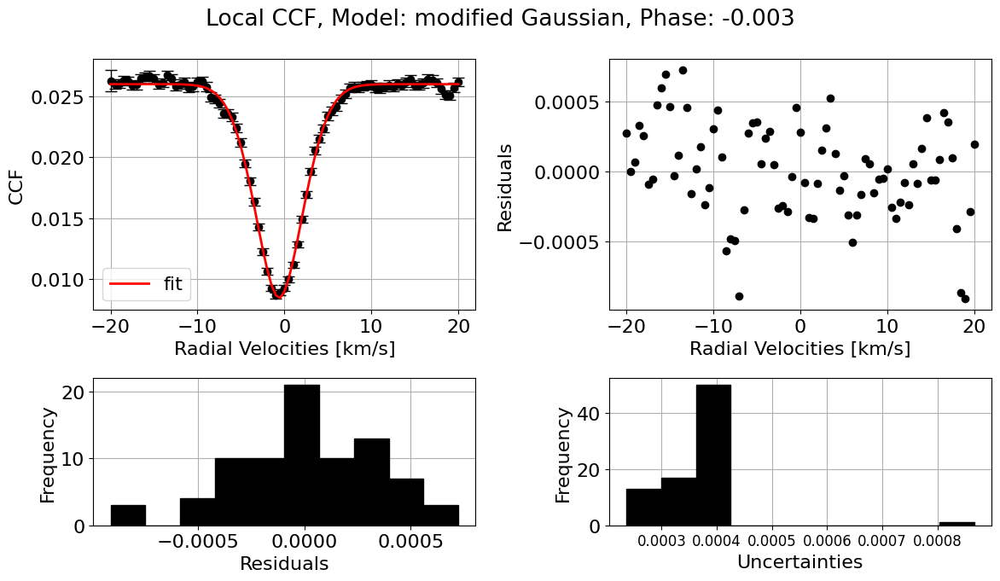

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.001
------------------------------
Fit parameters:
y0 = 0.026638 ± 0.000056
x0 = -0.277856 ± 0.021468
sigma = 2.822349 ± 0.040143
a = 0.017861 ± 0.000156
c = 1.855618 ± 0.044860
R^2:  0.9975
------------------------------
CCF parameters:
Central RV [km/s]: -0.277856 ± 0.021468
Continuum: 0.026638 ± 0.000056
Deph [%]: 32.949956 ± 0.600828
Width [km/s]: 2.822349 ± 0.040143


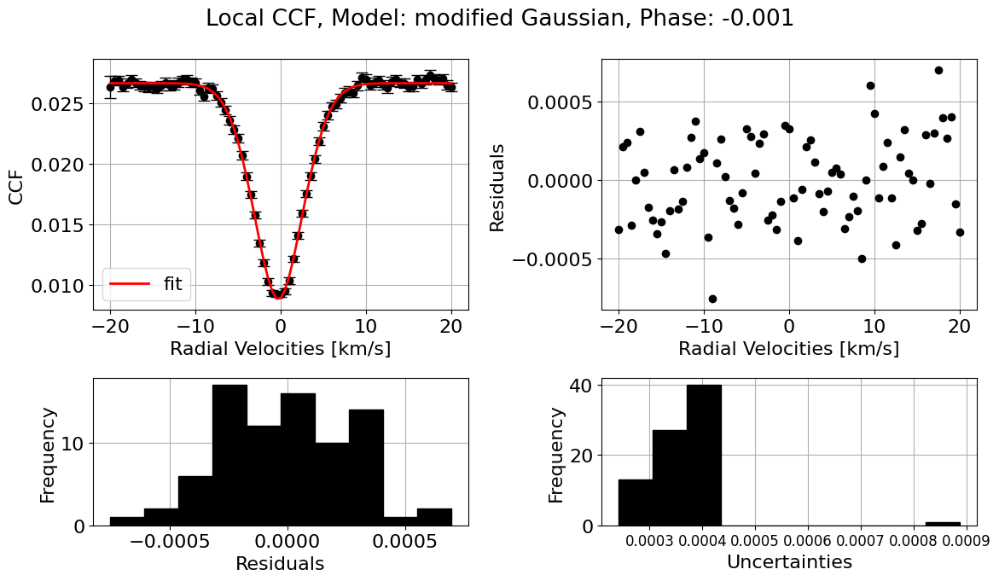

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0003
------------------------------
Fit parameters:
y0 = 0.026754 ± 0.000060
x0 = -0.043758 ± 0.022794
sigma = 2.810546 ± 0.042633
a = 0.017805 ± 0.000164
c = 1.838934 ± 0.047001
R^2:  0.9952
------------------------------
CCF parameters:
Central RV [km/s]: -0.043758 ± 0.022794
Continuum: 0.026754 ± 0.000060
Deph [%]: 33.451488 ± 0.630903
Width [km/s]: 2.810546 ± 0.042633


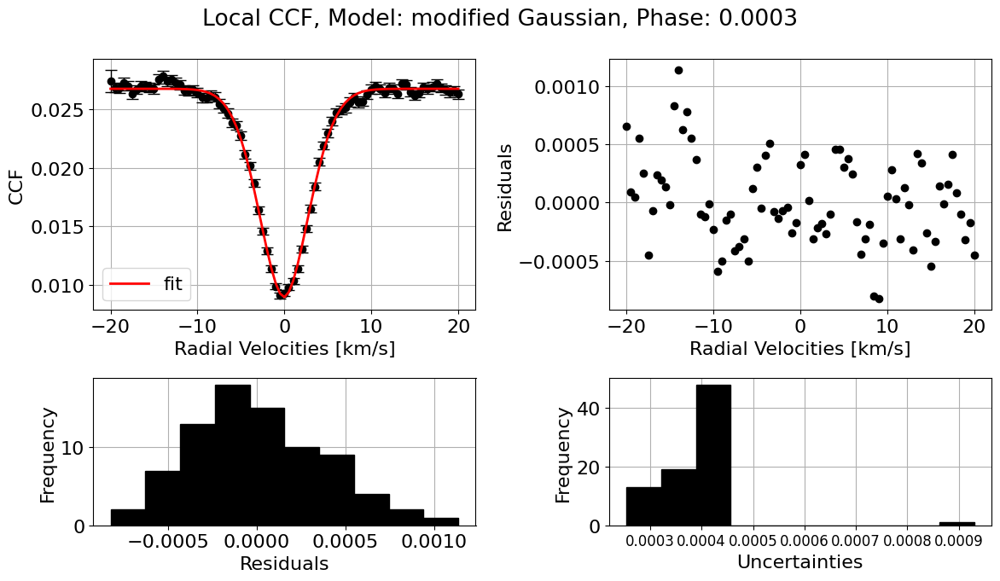

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0022
------------------------------
Fit parameters:
y0 = 0.026477 ± 0.000058
x0 = 0.326580 ± 0.022292
sigma = 2.706982 ± 0.041673
a = 0.017632 ± 0.000165
c = 1.857879 ± 0.048523
R^2:  0.9947
------------------------------
CCF parameters:
Central RV [km/s]: 0.326580 ± 0.022292
Continuum: 0.026477 ± 0.000058
Deph [%]: 33.405475 ± 0.640990
Width [km/s]: 2.706982 ± 0.041673


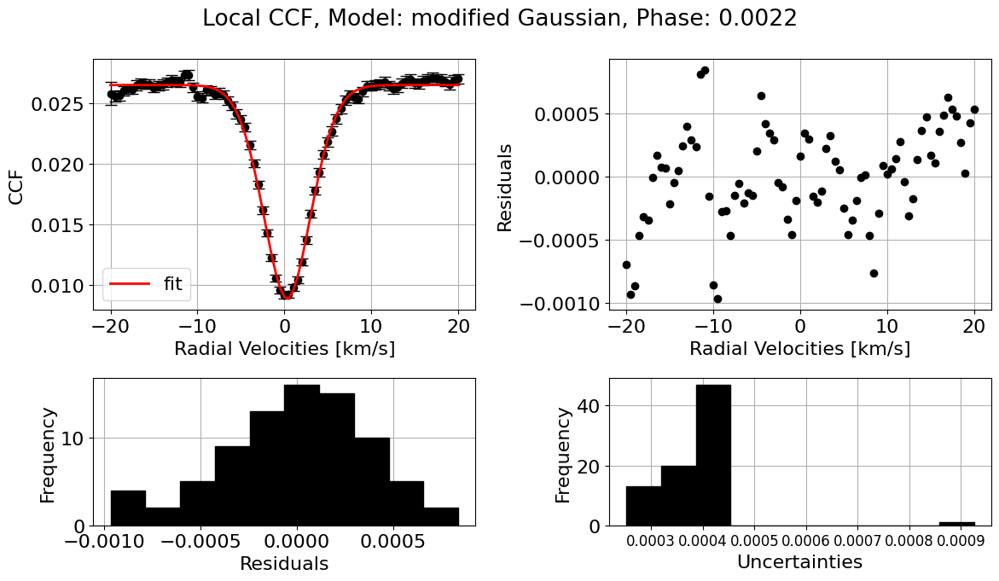

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0041
------------------------------
Fit parameters:
y0 = 0.025662 ± 0.000059
x0 = 0.688979 ± 0.023641
sigma = 2.825923 ± 0.043520
a = 0.016940 ± 0.000162
c = 1.908962 ± 0.051452
R^2:  0.9946
------------------------------
CCF parameters:
Central RV [km/s]: 0.688979 ± 0.023641
Continuum: 0.025662 ± 0.000059
Deph [%]: 33.989004 ± 0.648798
Width [km/s]: 2.825923 ± 0.043520


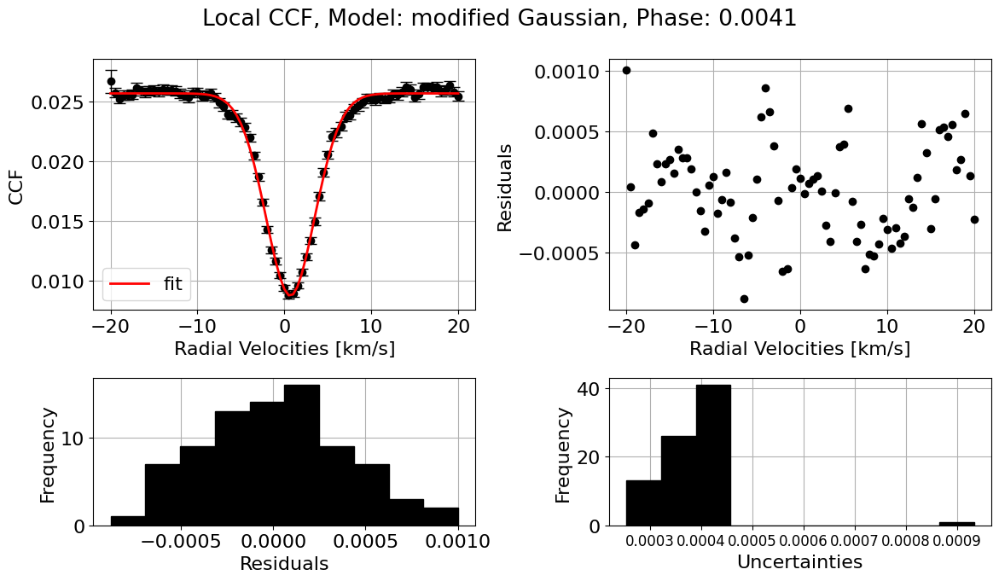

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0060
------------------------------
Fit parameters:
y0 = 0.024683 ± 0.000061
x0 = 1.005823 ± 0.025903
sigma = 2.853482 ± 0.047193
a = 0.016090 ± 0.000167
c = 1.940944 ± 0.057234
R^2:  0.9936
------------------------------
CCF parameters:
Central RV [km/s]: 1.005823 ± 0.025903
Continuum: 0.024683 ± 0.000061
Deph [%]: 34.815090 ± 0.696977
Width [km/s]: 2.853482 ± 0.047193


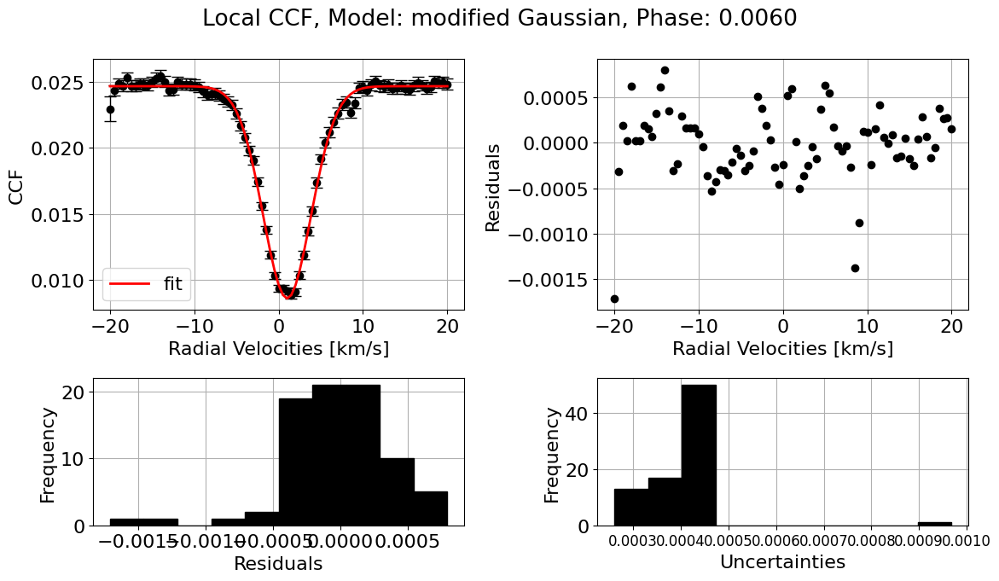

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0078
------------------------------
Fit parameters:
y0 = 0.022946 ± 0.000066
x0 = 1.315277 ± 0.030196
sigma = 2.784415 ± 0.056140
a = 0.015017 ± 0.000190
c = 1.911117 ± 0.066965
R^2:  0.9909
------------------------------
CCF parameters:
Central RV [km/s]: 1.315277 ± 0.030196
Continuum: 0.022946 ± 0.000066
Deph [%]: 34.551780 ± 0.851495
Width [km/s]: 2.784415 ± 0.056140


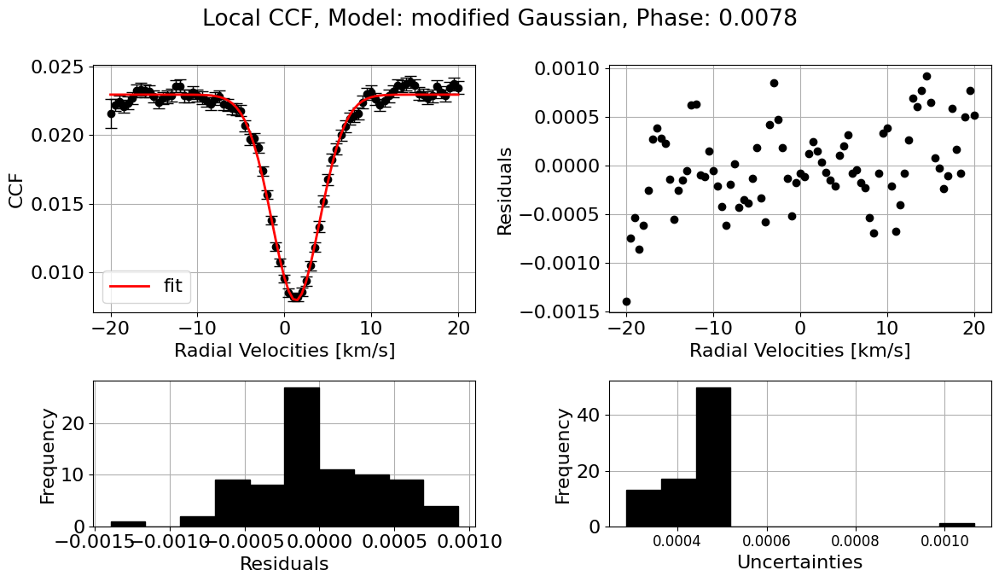

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0097
------------------------------
Fit parameters:
y0 = 0.019415 ± 0.000072
x0 = 1.703854 ± 0.041667
sigma = 2.869418 ± 0.076915
a = 0.012045 ± 0.000207
c = 1.939196 ± 0.091696
R^2:  0.9857
------------------------------
CCF parameters:
Central RV [km/s]: 1.703854 ± 0.041667
Continuum: 0.019415 ± 0.000072
Deph [%]: 37.958292 ± 1.088494
Width [km/s]: 2.869418 ± 0.076915


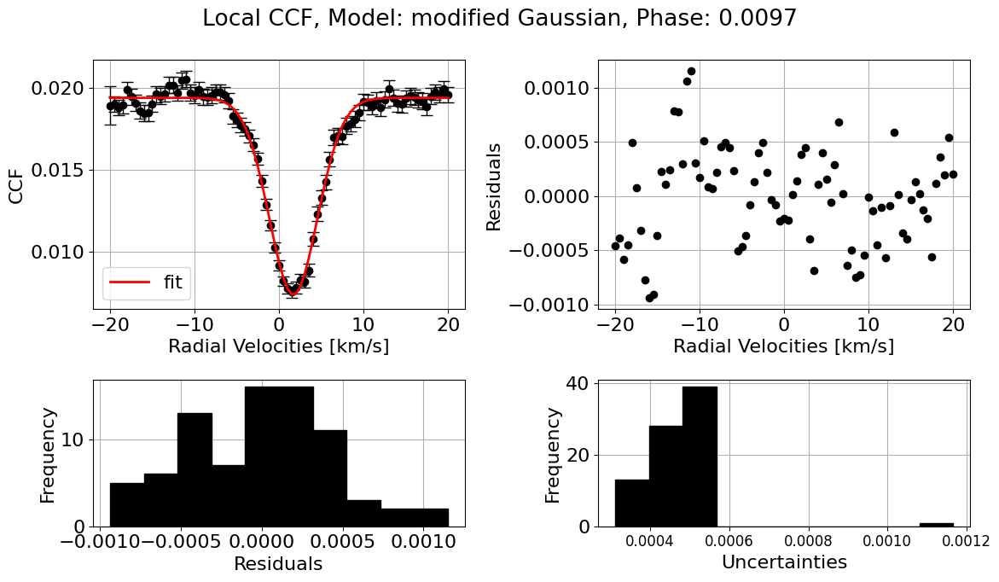

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0116
------------------------------
Fit parameters:
y0 = 0.013703 ± 0.000074
x0 = 1.981139 ± 0.062622
sigma = 2.942592 ± 0.109246
a = 0.008156 ± 0.000209
c = 2.209482 ± 0.166470
R^2:  0.9707
------------------------------
CCF parameters:
Central RV [km/s]: 1.981139 ± 0.062622
Continuum: 0.013703 ± 0.000074
Deph [%]: 40.479138 ± 1.555281
Width [km/s]: 2.942592 ± 0.109246


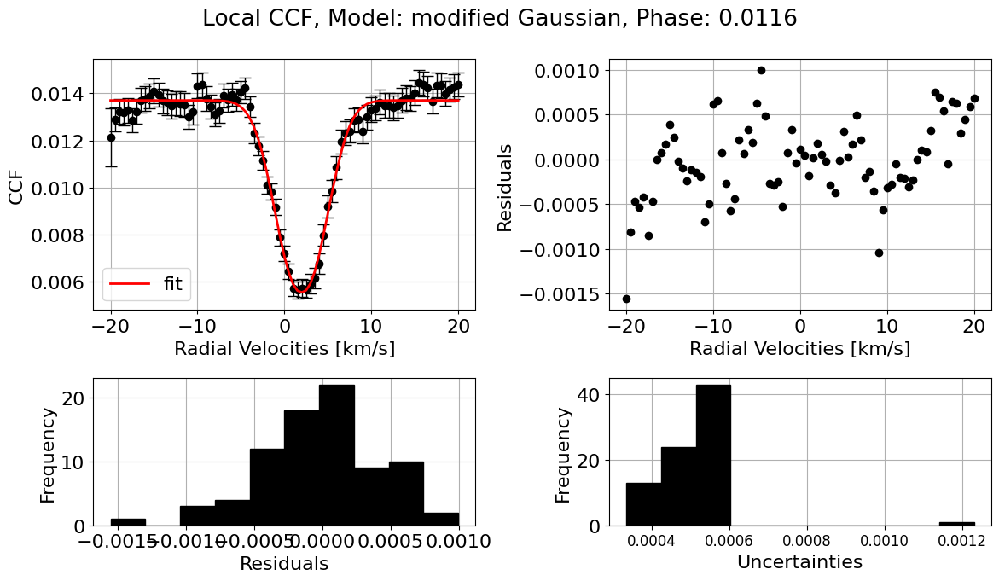

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0135
------------------------------
Fit parameters:
y0 = 0.007032 ± 0.000080
x0 = 2.514460 ± 0.134601
sigma = 3.193498 ± 0.255085
a = 0.004262 ± 0.000222
c = 1.864589 ± 0.250851
R^2:  0.9197
------------------------------
CCF parameters:
Central RV [km/s]: 2.514460 ± 0.134601
Continuum: 0.007032 ± 0.000080
Deph [%]: 39.395212 ± 3.225567
Width [km/s]: 3.193498 ± 0.255085


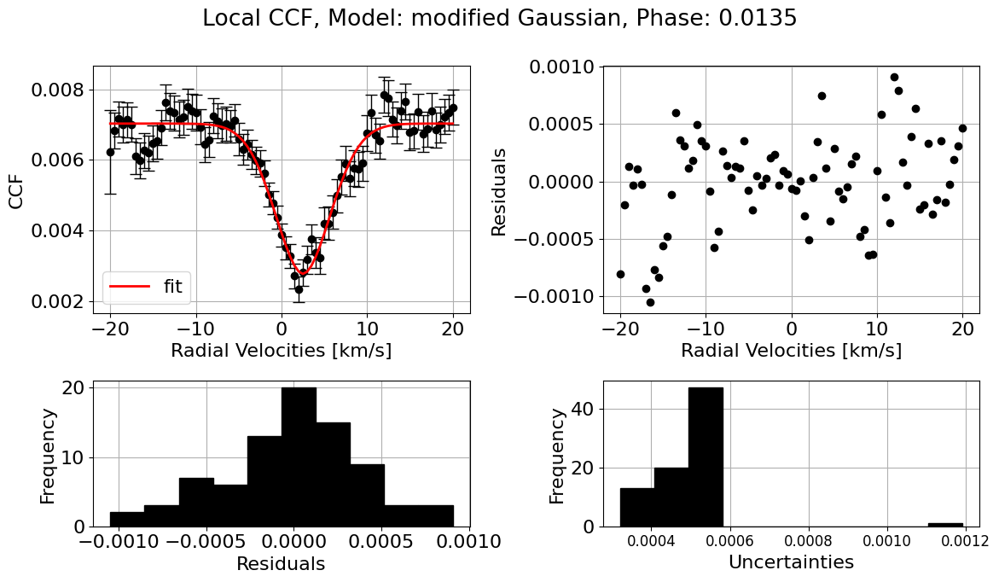

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0154
------------------------------
Fit parameters:
y0 = 0.002080 ± 0.000061
x0 = 3.139903 ± 4.001295
sigma = 5.815071 ± 2.357430
a = 0.000577 ± 0.000101
c = 58.557584 ± 2125.689097
R^2:  0.3007
------------------------------
CCF parameters:
Central RV [km/s]: 3.139903 ± 4.001295
Continuum: 0.002080 ± 0.000061
Deph [%]: 72.236012 ± 4.903109
Width [km/s]: 5.815071 ± 2.357430


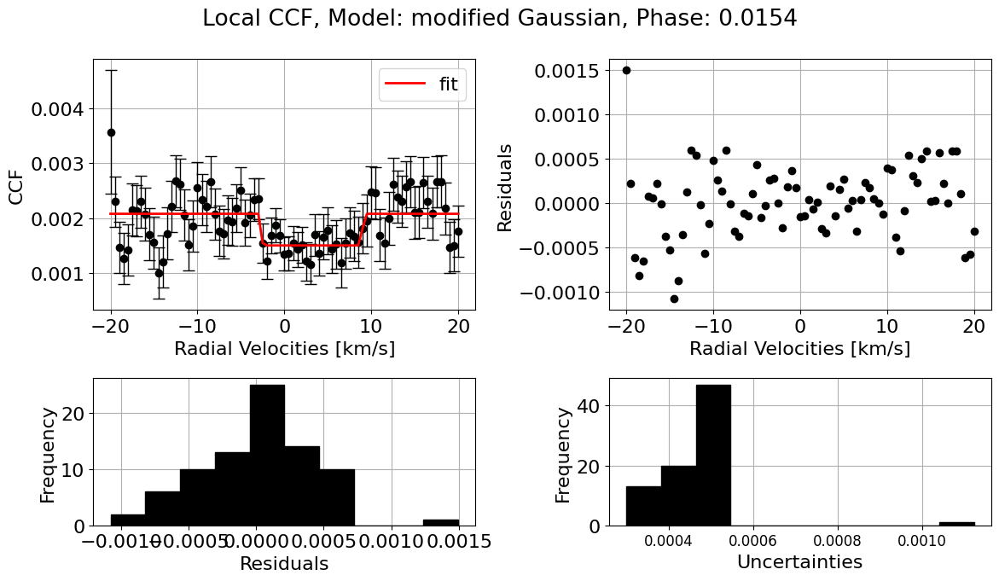

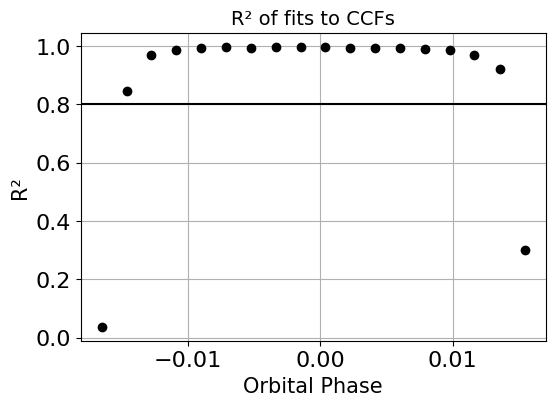

In [33]:
central_rv_array, continuum_array, depth_array, width_array, R2_array = hecate._CCF_parameters(CCFs=local_CCFs, ccf_type="local", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

In [34]:
phase_mu = get_phase_mu(planet_params, time)
phases, tr_dur, tr_ingress_egress, in_indices, out_indices = phase_mu.phases, phase_mu.tr_dur, phase_mu.tr_ingress_egress, phase_mu.in_indices, phase_mu.out_indices
in_phases = phases[np.isin(np.arange(len(phases)), in_indices)]

mu_in = get_phase_mu.mu(in_phases, planet_params)
indices_final = np.arange(2,len(mu_in)-2)

mu_min = get_phase_mu.mu(tr_dur/2-tr_ingress_egress/2, planet_params)
mu_max = get_phase_mu.mu(0, planet_params)

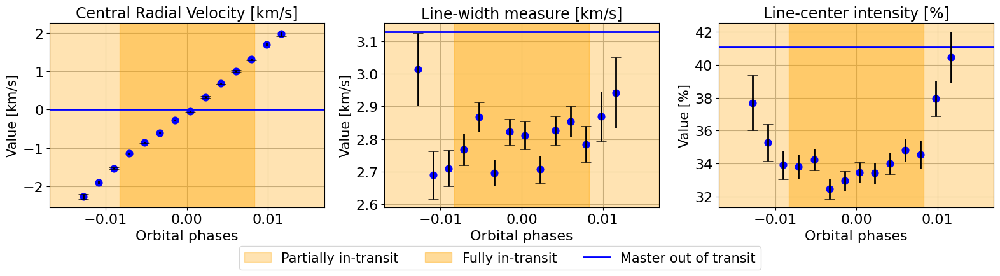

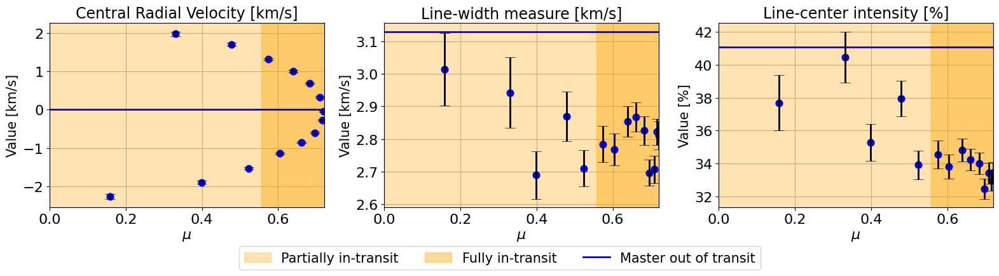

In [35]:
local_params = [central_rv_array, width_array, depth_array]
master_params = [master_central_rv_array, master_width_array, master_depth_array]

hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=False, plot_nested=False, save=None)

Central Radial Velocity [km/s]
----------------------------------------
Orbital phases


5533it [00:03, 1365.72it/s, batch: 0 | bound: 10 | nc: 23 | ncall: 102883 | eff(%):  5.352 | loglstar:   -inf < 23.291 <    inf | logz: 10.555 +/-  0.152 | dlogz: 11.742 >  0.010]   Traceback (most recent call last):
  File "/home/telmo/.local/lib/python3.10/site-packages/dynesty/dynesty.py", line 827, in __call__
    return self.func(np.asarray(x).copy(), *self.args, **self.kwargs)
  File "/home/telmo/phd_seminar/nested_sampling.py", line 63, in <lambda>
    like_A = lambda th: self.loglike_linear(th, x, y, yerr)
  File "/home/telmo/phd_seminar/nested_sampling.py", line 135, in loglike_linear
    return -0.5 * (np.sum((y-model)**2 * inv_sigma2 - np.log(inv_sigma2)))
KeyboardInterrupt
5571it [00:03, 1652.61it/s, batch: 0 | bound: 10 | nc: 23 | ncall: 103757 | eff(%):  5.344 | loglstar:   -inf < 23.772 <    inf | logz: 10.964 +/-  0.153 | dlogz: 11.257 >  0.010]


Exception while calling loglikelihood function:
  params: (166.60993279659988, -0.10538699216184888, -3.018491854187845)
  args: []
  kwargs: {}
  exception:


KeyboardInterrupt: 

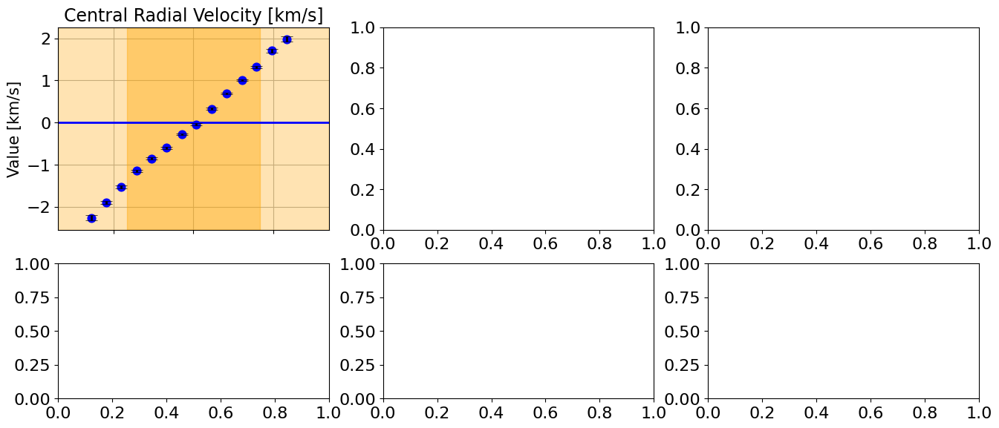

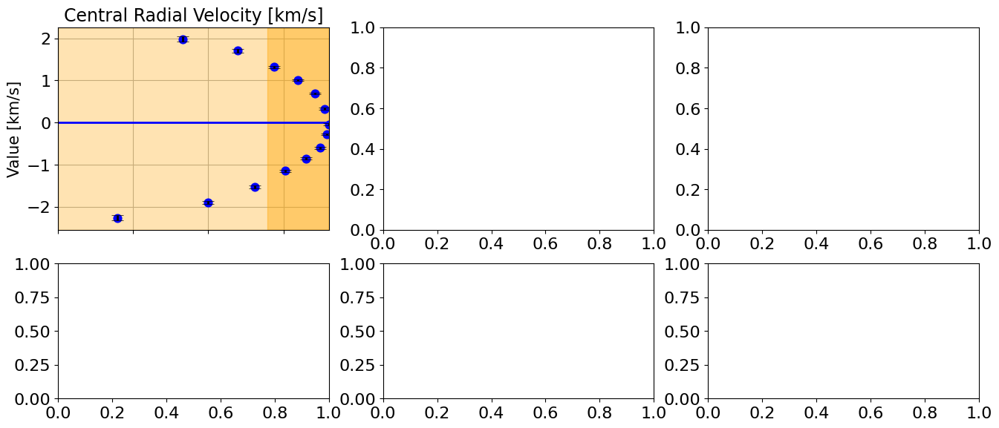

In [24]:
hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=True, plot_nested=True, save=None)

# Weak Fe I lines

In [36]:
spectra, time, airmass, berv, bervmax, snr, list_spectra = get_spectra(day= '2021-08-31')
CCFs, _, _, _, _, _, _ = get_CCFs(planet_params, day= '2021-08-31', plot=False)

In [37]:
mask = np.array([4551.6499, 5539.2824, 6165.3641,
4593.5268, 5552.6919, 6226.7403, 4657.5879, 5568.8689, 6311.5050,
4658.2976, 5607.6668, 6315.8164, 4672.8364, 5611.3587, 6380.7483,
4726.1396, 5618.6360, 6385.7206, 4785.9583, 5635.8247, 6392.5429,
4794.3571, 5636.6992, 6436.4102, 4799.4092, 5646.6854, 6496.4738,
4802.5216, 5651.4716, 6574.2325, 4808.1509, 5652.3194, 6581.2143,
4809.9400, 5661.3480, 6608.0301, 5213.8071, 5677.6875, 6627.5488,
5223.1851, 5680.2441, 6646.9355, 5236.2039, 5720.8950, 6703.5720,
5293.9609, 5793.9178, 6710.3213, 5294.5493, 5807.7868, 6737.9830,
5358.1168, 5811.9172, 6739.5243, 5386.3345, 5814.8092, 6745.9626,
5395.2187, 5827.8794, 6746.9508, 5417.0405, 5835.1018, 6752.7107,
5460.8762, 5852.2222, 6793.2656, 5461.5530, 5858.7840, 6806.8491,
5464.2825, 5861.1123, 6820.3730, 5470.0957, 5881.2822, 6828.5976,
5487.1489, 5902.4755, 6839.8340, 5491.8346, 5929.6802, 6841.3450,
5493.5012, 6034.0365, 6843.6606, 5522.4491, 6082.7147])

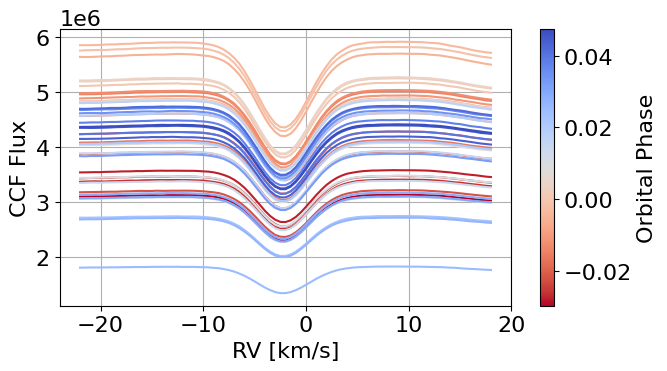

In [38]:
RV_reference = CCFs[0,2,:] #same as in white light CCF

CCFs_weak_iron = build_CCF(time, planet_params, spectra, RV_reference, mask, berv, bervmax, plot=True).CCFs

In [39]:
hecate = HECATE(planet_params, stellar_params, time, CCFs_weak_iron)

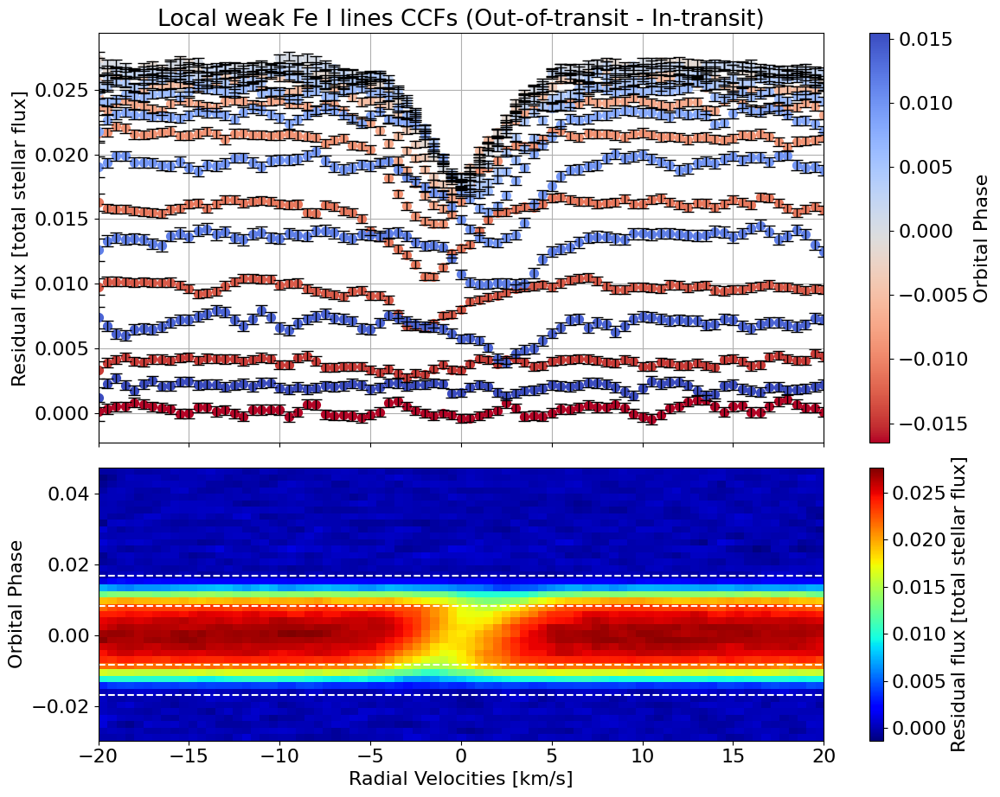

In [40]:
ccf_type = "weak Fe I lines"
model_fit = "modified Gaussian"
plot = {"SOAP":False, "fits_initial_CCF":False, "sys_vel":False, "avg_out_of_transit_CCF":False, "local_CCFs":True}

local_CCFs, CCFs_sub_all, CCFs_flux_corr, phases, in_phases = hecate._extract_local_CCF(model_fit, ccf_type, plot, save=None)

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.016
------------------------------
Fit parameters:
y0 = 0.024052 ± 0.100589
x0 = -0.010189 ± 0.172054
sigma = 2881713.681148 ± 0.000000
a = 0.024756 ± 0.098385
c = 0.200398 ± 0.508647
R^2:  0.1737
------------------------------
CCF parameters:
Central RV [km/s]: -0.010189 ± 0.172054
Continuum: 0.024052 ± 0.100589
Deph [%]: -2.927172 ± 593.826095
Width [km/s]: 2881713.681148 ± 0.000000


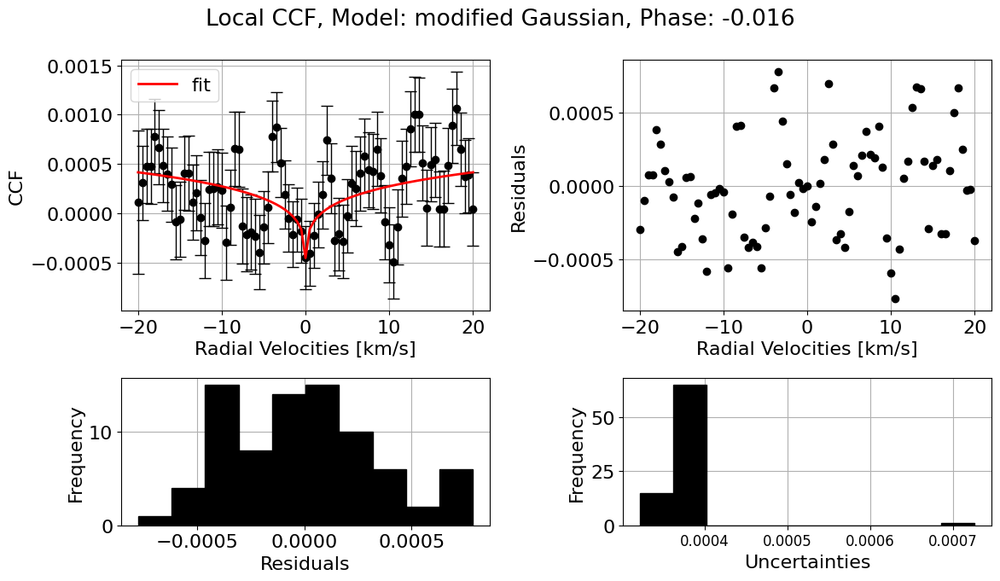

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.014
------------------------------
Fit parameters:
y0 = 0.004025 ± 0.000049
x0 = -3.102897 ± 0.336751
sigma = 1.886860 ± 0.726722
a = 0.001099 ± 0.000240
c = 1.577434 ± 0.770727
R^2:  0.5585
------------------------------
CCF parameters:
Central RV [km/s]: -3.102897 ± 0.336751
Continuum: 0.004025 ± 0.000049
Deph [%]: 72.702104 ± 5.974254
Width [km/s]: 1.886860 ± 0.726722


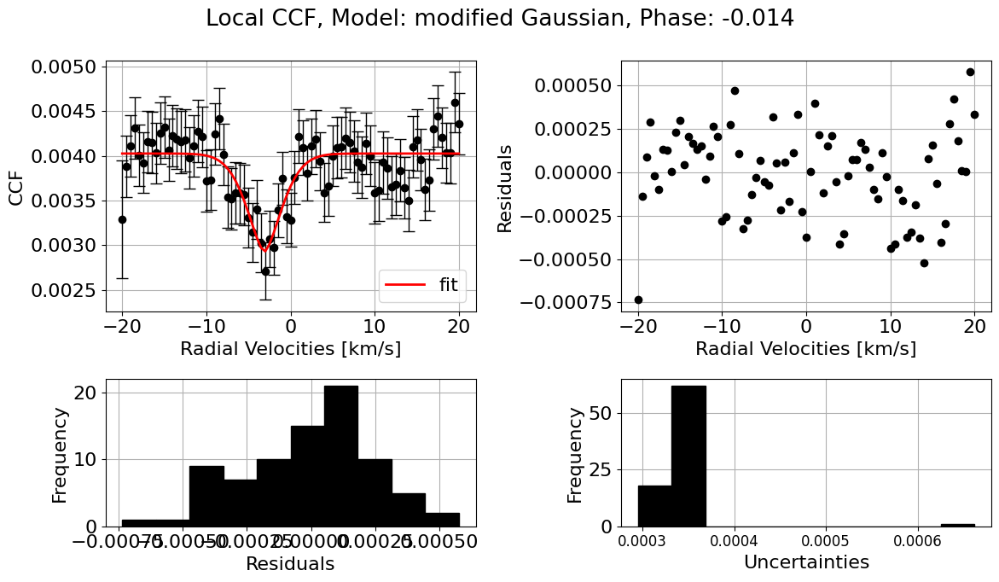

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.012
------------------------------
Fit parameters:
y0 = 0.009854 ± 0.000048
x0 = -1.979492 ± 0.103707
sigma = 1.571094 ± 0.225330
a = 0.003358 ± 0.000250
c = 1.400052 ± 0.221760
R^2:  0.878
------------------------------
CCF parameters:
Central RV [km/s]: -1.979492 ± 0.103707
Continuum: 0.009854 ± 0.000048
Deph [%]: 65.920761 ± 2.539229
Width [km/s]: 1.571094 ± 0.225330


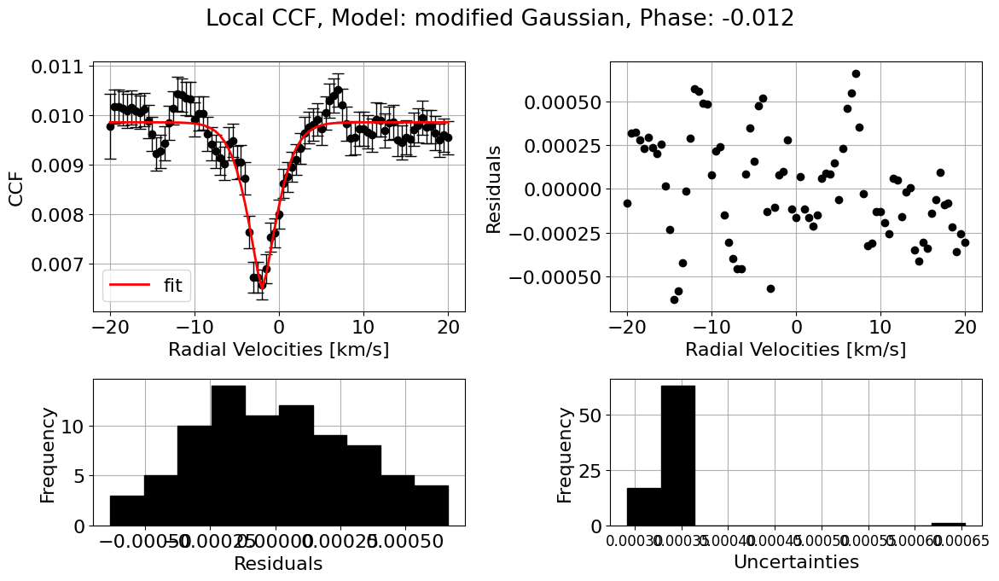

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.010
------------------------------
Fit parameters:
y0 = 0.016145 ± 0.000047
x0 = -1.813887 ± 0.063511
sigma = 1.875680 ± 0.130487
a = 0.005432 ± 0.000220
c = 1.709133 ± 0.168456
R^2:  0.9519
------------------------------
CCF parameters:
Central RV [km/s]: -1.813887 ± 0.063511
Continuum: 0.016145 ± 0.000047
Deph [%]: 66.357530 ± 1.365168
Width [km/s]: 1.875680 ± 0.130487


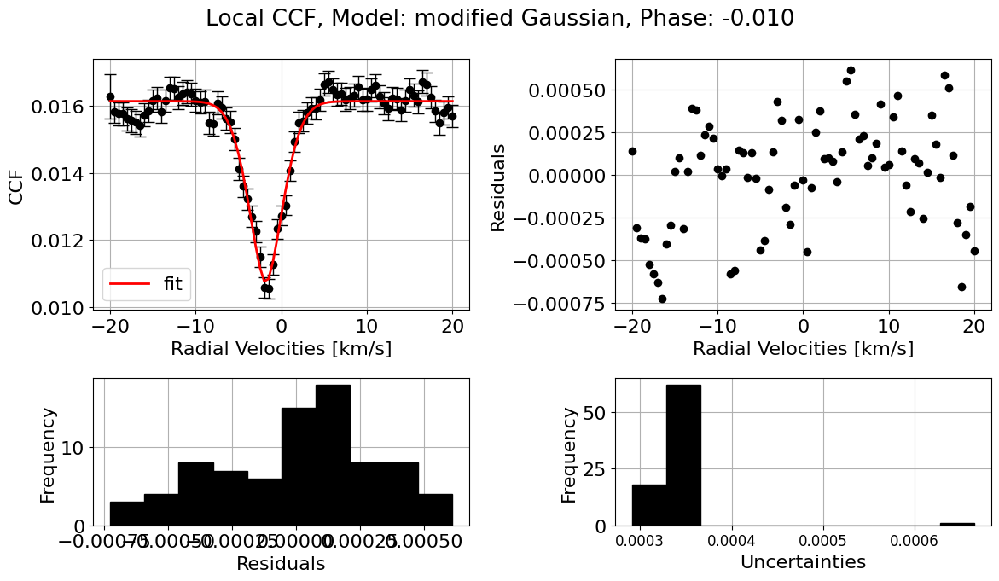

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.008
------------------------------
Fit parameters:
y0 = 0.021454 ± 0.000047
x0 = -1.524127 ± 0.049196
sigma = 1.939673 ± 0.096437
a = 0.007006 ± 0.000211
c = 1.838045 ± 0.142069
R^2:  0.9793
------------------------------
CCF parameters:
Central RV [km/s]: -1.524127 ± 0.049196
Continuum: 0.021454 ± 0.000047
Deph [%]: 67.342799 ± 0.987700
Width [km/s]: 1.939673 ± 0.096437


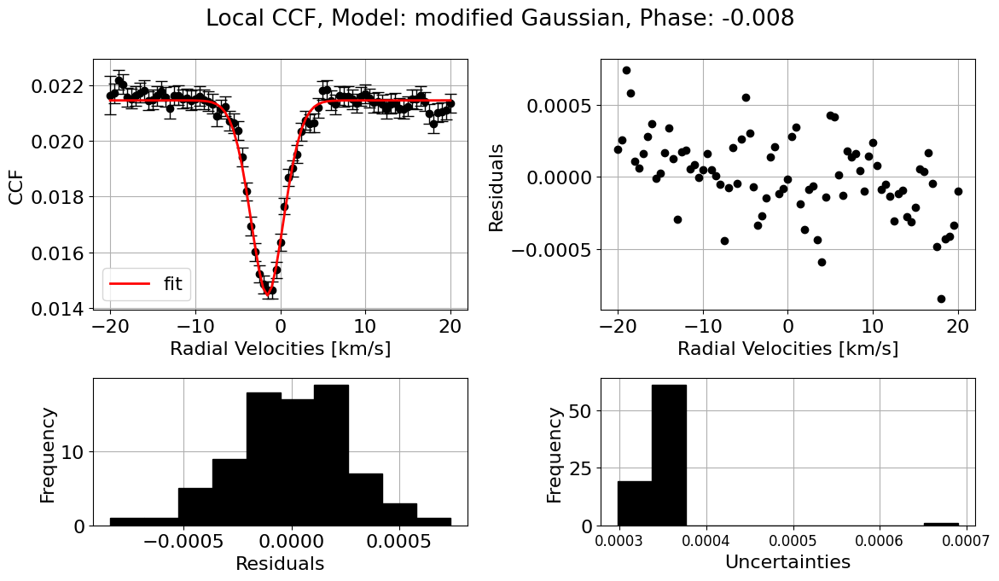

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.007
------------------------------
Fit parameters:
y0 = 0.023893 ± 0.000047
x0 = -1.171443 ± 0.043751
sigma = 1.978795 ± 0.088642
a = 0.007929 ± 0.000209
c = 1.747970 ± 0.114733
R^2:  0.9858
------------------------------
CCF parameters:
Central RV [km/s]: -1.171443 ± 0.043751
Continuum: 0.023893 ± 0.000047
Deph [%]: 66.814442 ± 0.877058
Width [km/s]: 1.978795 ± 0.088642


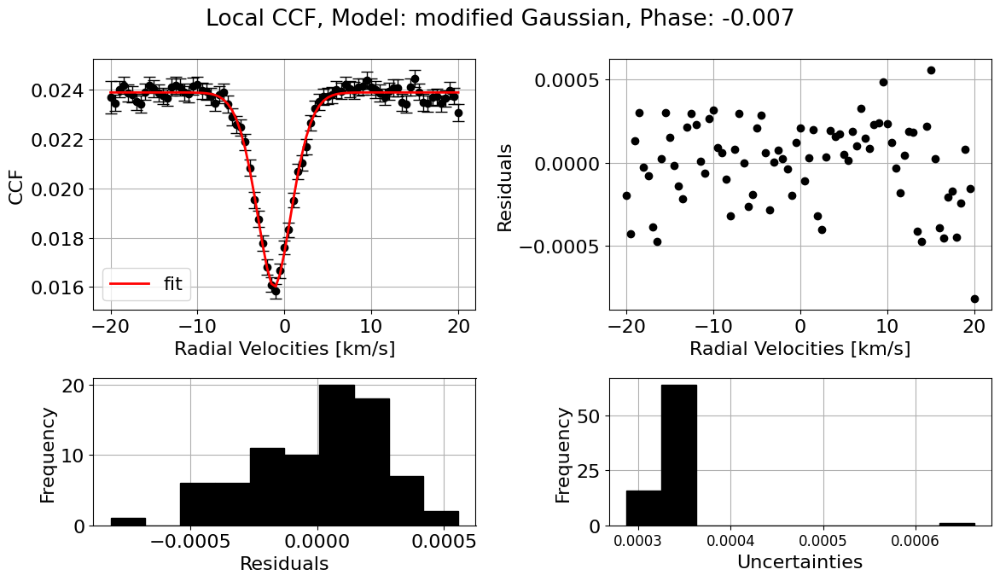

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.005
------------------------------
Fit parameters:
y0 = 0.025362 ± 0.000044
x0 = -0.830002 ± 0.039222
sigma = 2.004559 ± 0.080007
a = 0.008287 ± 0.000193
c = 1.722563 ± 0.099223
R^2:  0.9775
------------------------------
CCF parameters:
Central RV [km/s]: -0.830002 ± 0.039222
Continuum: 0.025362 ± 0.000044
Deph [%]: 67.326405 ± 0.762559
Width [km/s]: 2.004559 ± 0.080007


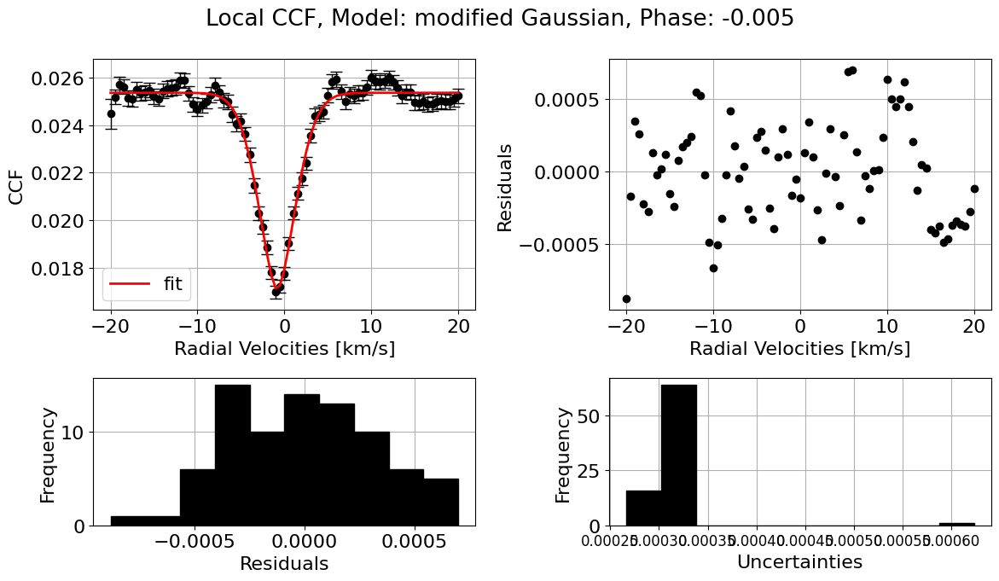

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.003
------------------------------
Fit parameters:
y0 = 0.026071 ± 0.000042
x0 = -0.477330 ± 0.038286
sigma = 2.138035 ± 0.073692
a = 0.008305 ± 0.000174
c = 1.865198 ± 0.102822
R^2:  0.9817
------------------------------
CCF parameters:
Central RV [km/s]: -0.477330 ± 0.038286
Continuum: 0.026071 ± 0.000042
Deph [%]: 68.143465 ± 0.668158
Width [km/s]: 2.138035 ± 0.073692


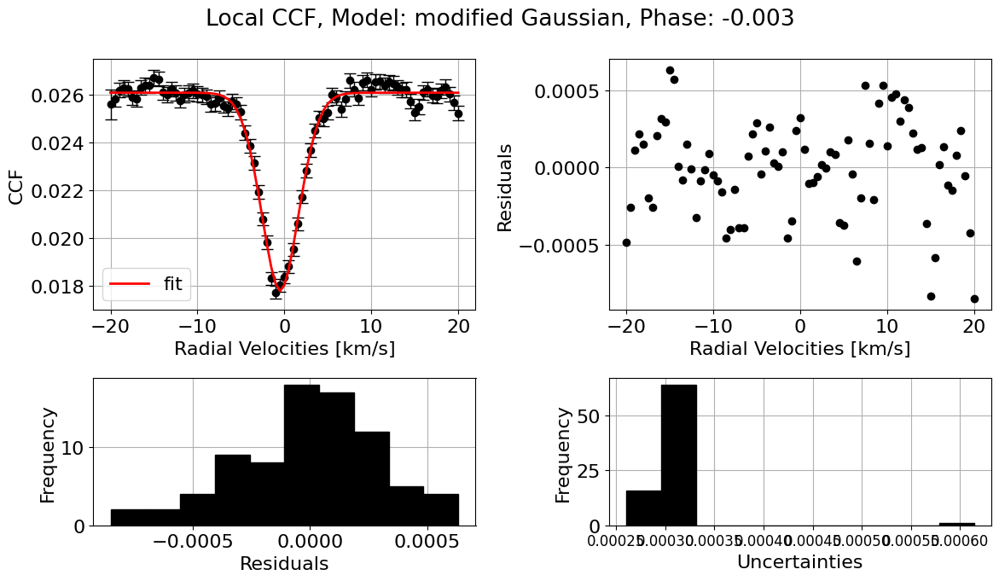

##############################
Fitting modified Gaussian model to local CCF
Phase: -0.001
------------------------------
Fit parameters:
y0 = 0.026672 ± 0.000043
x0 = -0.198912 ± 0.037294
sigma = 2.068312 ± 0.074172
a = 0.008542 ± 0.000183
c = 1.797764 ± 0.098466
R^2:  0.9833
------------------------------
CCF parameters:
Central RV [km/s]: -0.198912 ± 0.037294
Continuum: 0.026672 ± 0.000043
Deph [%]: 67.975431 ± 0.686733
Width [km/s]: 2.068312 ± 0.074172


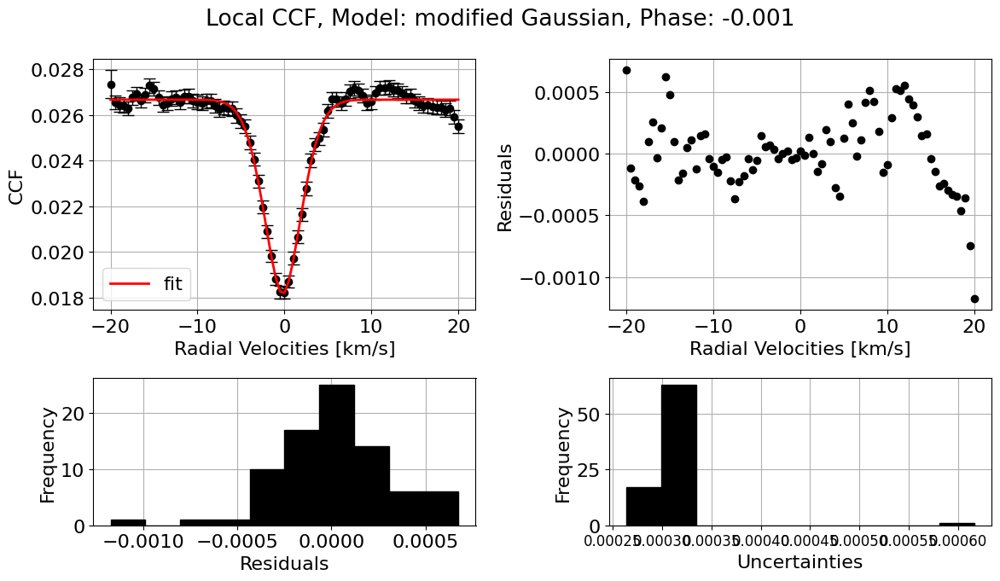

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0003
------------------------------
Fit parameters:
y0 = 0.026782 ± 0.000044
x0 = 0.117044 ± 0.037426
sigma = 2.098051 ± 0.071490
a = 0.008759 ± 0.000184
c = 1.932329 ± 0.109579
R^2:  0.9841
------------------------------
CCF parameters:
Central RV [km/s]: 0.117044 ± 0.037426
Continuum: 0.026782 ± 0.000044
Deph [%]: 67.293570 ± 0.690874
Width [km/s]: 2.098051 ± 0.071490


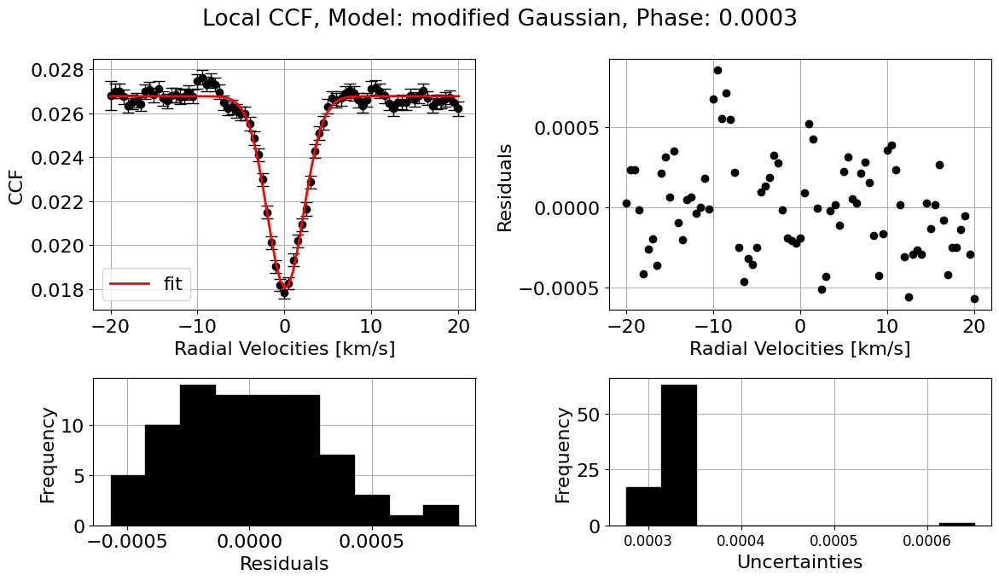

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0022
------------------------------
Fit parameters:
y0 = 0.026523 ± 0.000043
x0 = 0.332856 ± 0.036781
sigma = 1.998148 ± 0.070546
a = 0.008631 ± 0.000187
c = 1.912141 ± 0.110970
R^2:  0.9849
------------------------------
CCF parameters:
Central RV [km/s]: 0.332856 ± 0.036781
Continuum: 0.026523 ± 0.000043
Deph [%]: 67.457272 ± 0.707260
Width [km/s]: 1.998148 ± 0.070546


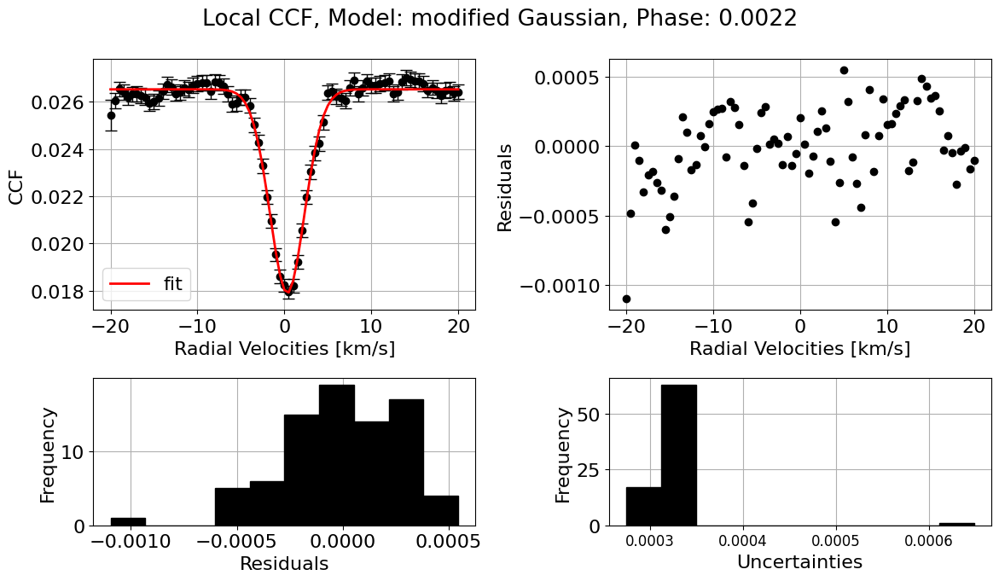

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0041
------------------------------
Fit parameters:
y0 = 0.025740 ± 0.000043
x0 = 0.712637 ± 0.037792
sigma = 2.069505 ± 0.071971
a = 0.008458 ± 0.000184
c = 1.962596 ± 0.115414
R^2:  0.9826
------------------------------
CCF parameters:
Central RV [km/s]: 0.712637 ± 0.037792
Continuum: 0.025740 ± 0.000043
Deph [%]: 67.140758 ± 0.716560
Width [km/s]: 2.069505 ± 0.071971


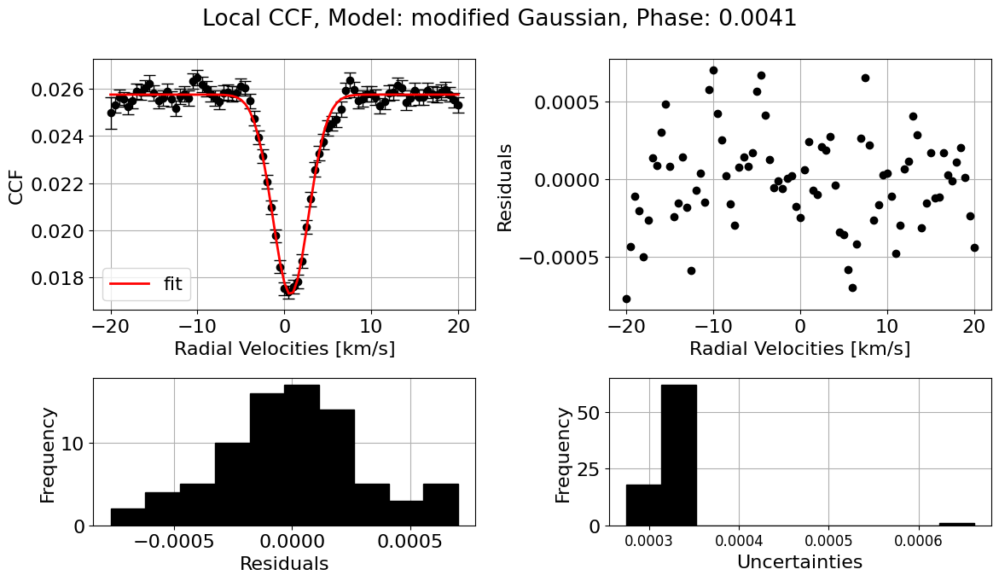

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0060
------------------------------
Fit parameters:
y0 = 0.024775 ± 0.000045
x0 = 0.984647 ± 0.042814
sigma = 2.250775 ± 0.078040
a = 0.007811 ± 0.000177
c = 2.128254 ± 0.137863
R^2:  0.9794
------------------------------
CCF parameters:
Central RV [km/s]: 0.984647 ± 0.042814
Continuum: 0.024775 ± 0.000045
Deph [%]: 68.471547 ± 0.717266
Width [km/s]: 2.250775 ± 0.078040


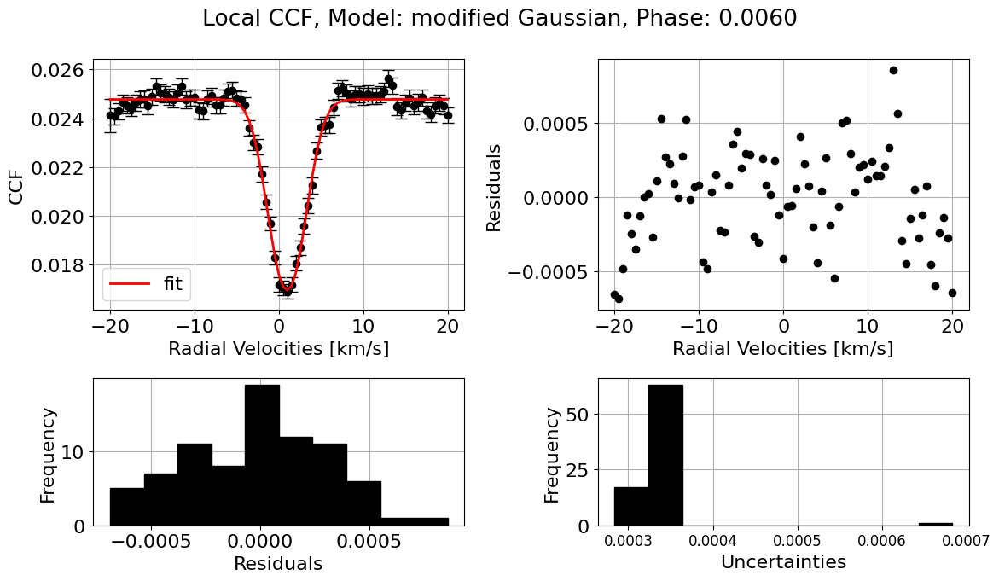

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0078
------------------------------
Fit parameters:
y0 = 0.023049 ± 0.000048
x0 = 1.386555 ± 0.046873
sigma = 1.954991 ± 0.088465
a = 0.007381 ± 0.000212
c = 2.010773 ± 0.157324
R^2:  0.9705
------------------------------
CCF parameters:
Central RV [km/s]: 1.386555 ± 0.046873
Continuum: 0.023049 ± 0.000048
Deph [%]: 67.976299 ± 0.921365
Width [km/s]: 1.954991 ± 0.088465


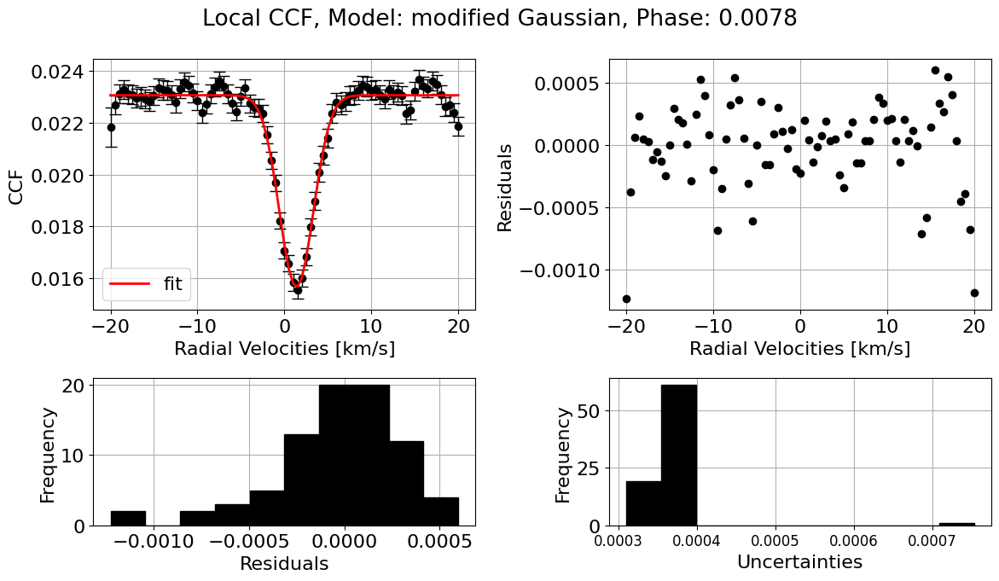

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0097
------------------------------
Fit parameters:
y0 = 0.019437 ± 0.000054
x0 = 1.696950 ± 0.063922
sigma = 2.098127 ± 0.125941
a = 0.006341 ± 0.000233
c = 1.850697 ± 0.174425
R^2:  0.9625
------------------------------
CCF parameters:
Central RV [km/s]: 1.696950 ± 0.063922
Continuum: 0.019437 ± 0.000054
Deph [%]: 67.376274 ± 1.200831
Width [km/s]: 2.098127 ± 0.125941


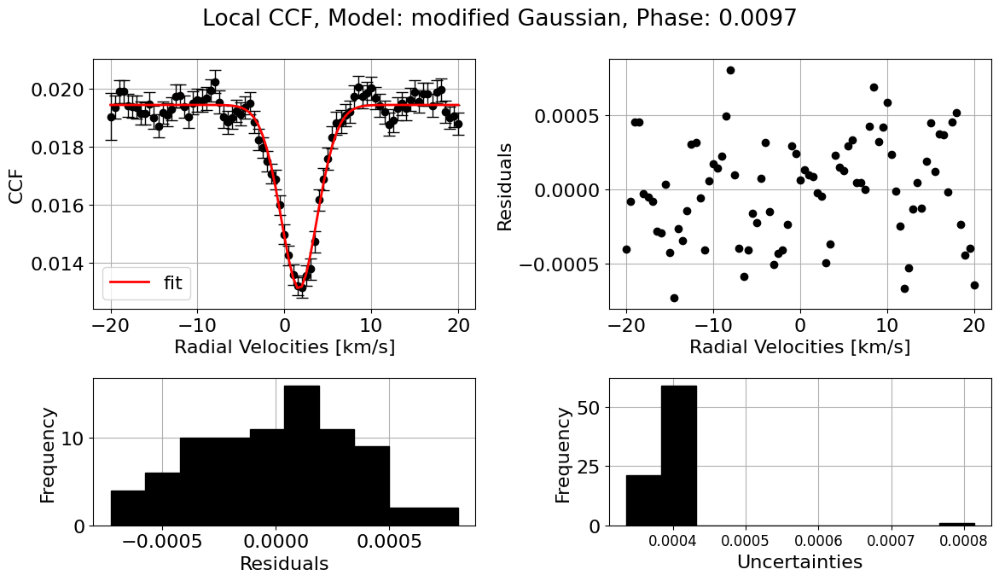

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0116
------------------------------
Fit parameters:
y0 = 0.013715 ± 0.000054
x0 = 2.054965 ± 0.096979
sigma = 2.286031 ± 0.164801
a = 0.003912 ± 0.000209
c = 2.611971 ± 0.444414
R^2:  0.9159
------------------------------
CCF parameters:
Central RV [km/s]: 2.054965 ± 0.096979
Continuum: 0.013715 ± 0.000054
Deph [%]: 71.479962 ± 1.531571
Width [km/s]: 2.286031 ± 0.164801


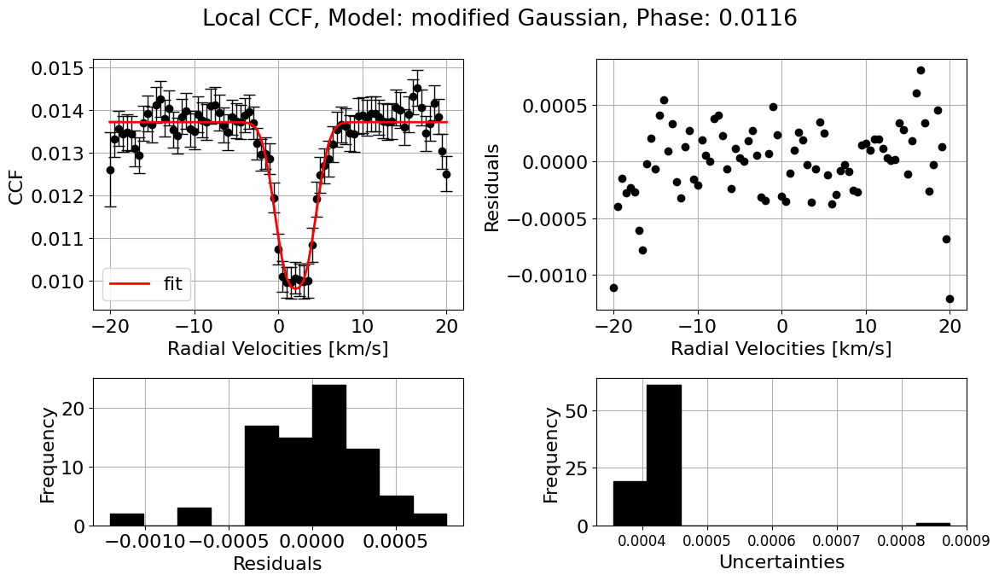

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0135
------------------------------
Fit parameters:
y0 = 0.007045 ± 0.000055
x0 = 2.468804 ± 0.127611
sigma = 1.356032 ± 0.276083
a = 0.003039 ± 0.000321
c = 1.400977 ± 0.309153
R^2:  0.7611
------------------------------
CCF parameters:
Central RV [km/s]: 2.468804 ± 0.127611
Continuum: 0.007045 ± 0.000055
Deph [%]: 56.860062 ± 4.569842
Width [km/s]: 1.356032 ± 0.276083


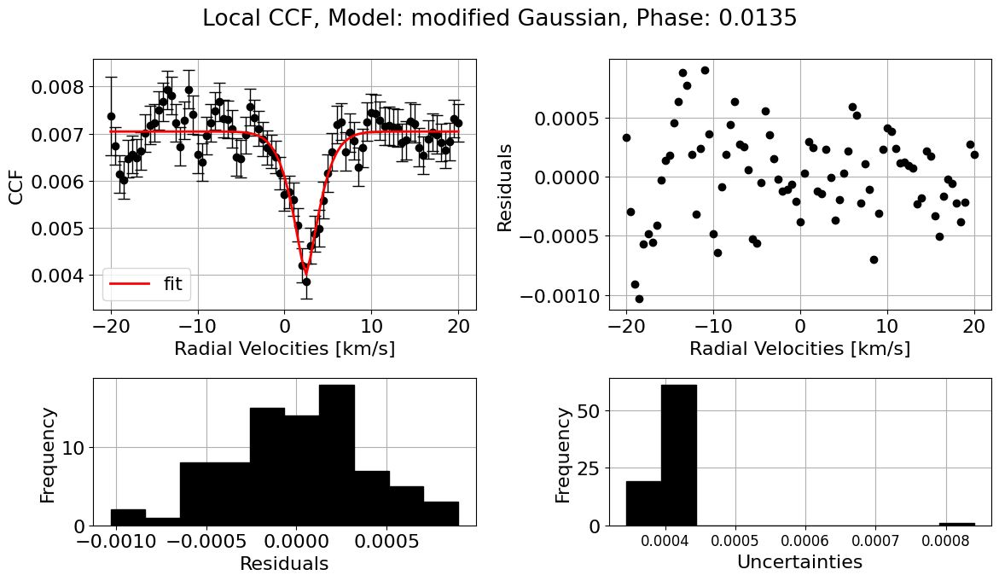

##############################
Fitting modified Gaussian model to local CCF
Phase: 0.0154
------------------------------
Fit parameters:
y0 = 0.002056 ± 0.000048
x0 = 2.660545 ± 0.266820
sigma = 0.311443 ± 1.131332
a = 0.000995 ± 0.001562
c = 0.863779 ± 1.556719
R^2:  0.1516
------------------------------
CCF parameters:
Central RV [km/s]: 2.660545 ± 0.266820
Continuum: 0.002056 ± 0.000048
Deph [%]: 51.613184 ± 75.984987
Width [km/s]: 0.311443 ± 1.131332


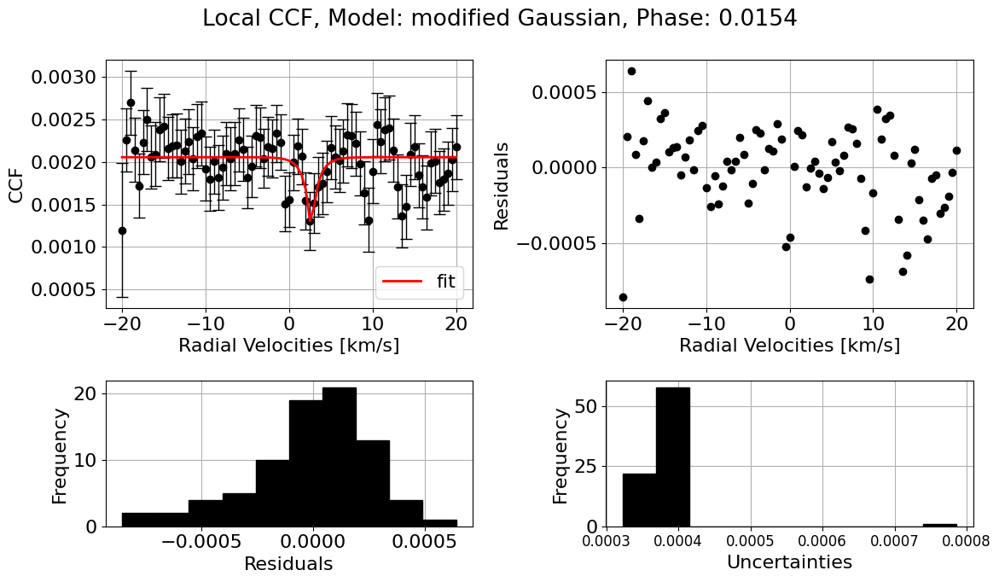

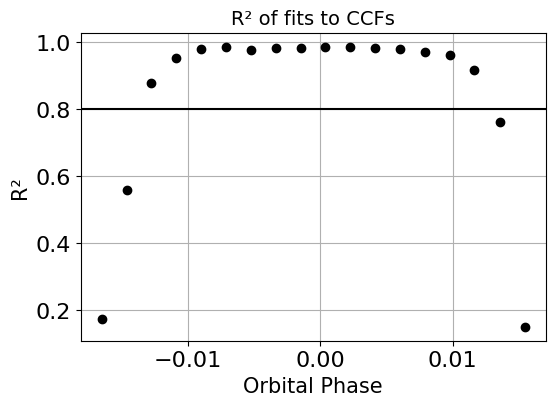

In [41]:
central_rv_array, continuum_array, depth_array, width_array, R2_array = hecate._CCF_parameters(CCFs=local_CCFs, ccf_type="local", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

In [42]:
phase_mu = get_phase_mu(planet_params, time)
phases, tr_dur, tr_ingress_egress, in_indices, out_indices = phase_mu.phases, phase_mu.tr_dur, phase_mu.tr_ingress_egress, phase_mu.in_indices, phase_mu.out_indices
in_phases = phases[np.isin(np.arange(len(phases)), in_indices)]

mu_in = get_phase_mu.mu(in_phases, planet_params)
indices_final = np.arange(2,len(mu_in)-2) 

mu_min = get_phase_mu.mu(tr_dur/2-tr_ingress_egress/2, planet_params)
mu_max = get_phase_mu.mu(0, planet_params)

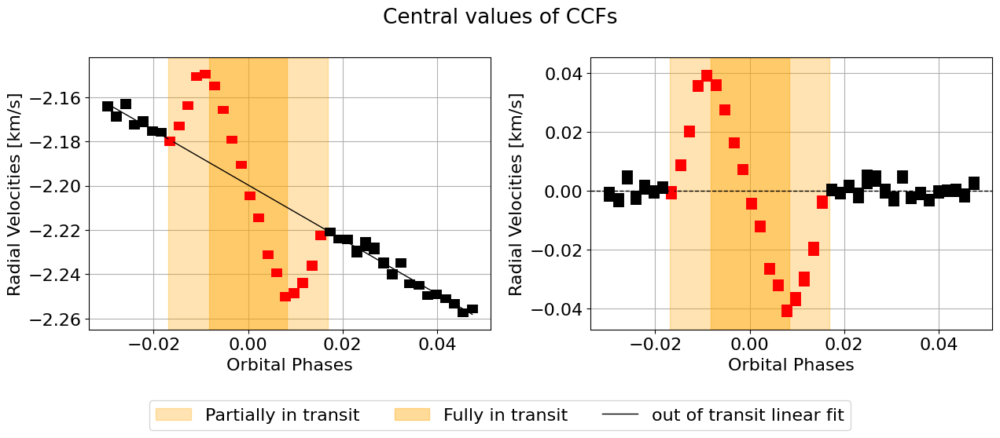

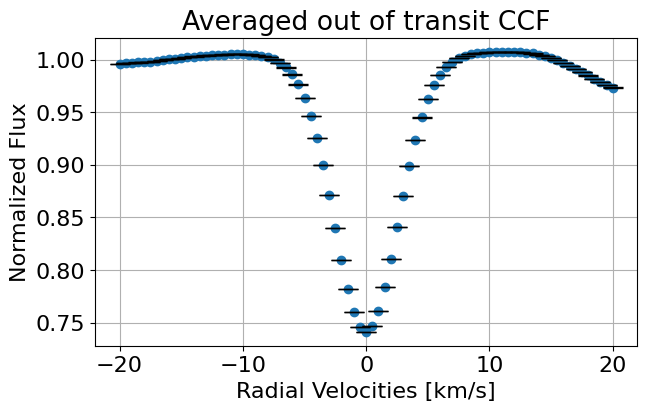

##############################
Fitting modified Gaussian model to master CCF
------------------------------
Fit parameters:
y0 = 1.000255 ± 0.000011
x0 = 0.000076 ± 0.000335
sigma = 2.567499 ± 0.000619
a = 0.257622 ± 0.000040
c = 2.051952 ± 0.000892
R^2:  0.9926
------------------------------
CCF parameters:
Central RV [km/s]: 0.000076 ± 0.000335
Continuum: 1.000255 ± 0.000011
Deph [%]: 74.244332 ± 0.004023
Width [km/s]: 2.567499 ± 0.000619


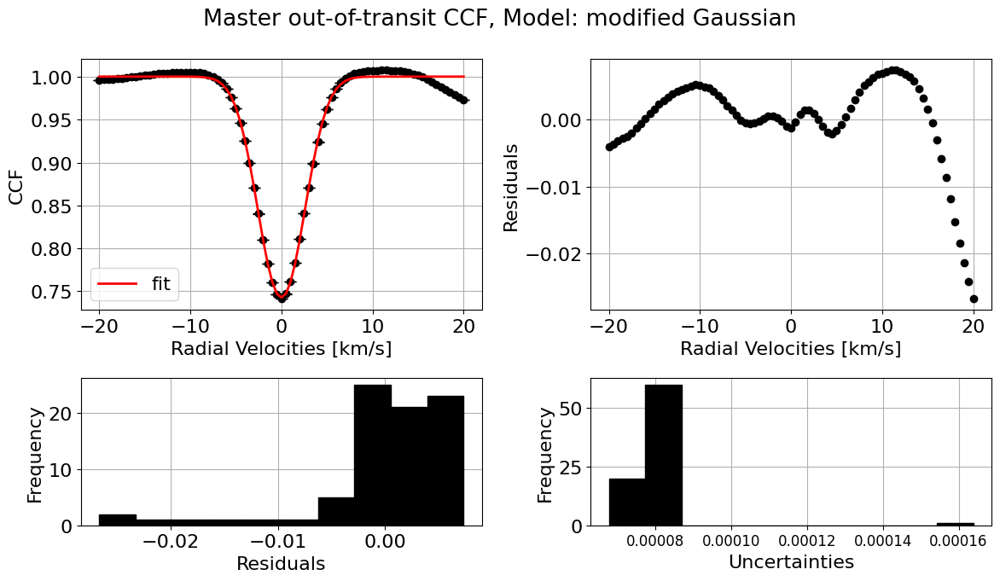

In [43]:
sysvel_corr = sysvel_correction(planet_params, time, CCFs_weak_iron, model="modified Gaussian", plot_fits=False, plot_sys_vel=True)
CCFs_sysvel_corr = sysvel_corr.CCFs_sysvel_corr

RV_reference = np.arange(round(np.max(CCFs_sysvel_corr[:,2,0])), round(np.min(CCFs_sysvel_corr[:,2,-1]))+0.5, 0.5)

CCF_interp, avg_out_of_transit_CCF = hecate._avg_out_of_transit_CCF(CCFs_sysvel_corr, RV_reference, plot=True, save=None)

master_central_rv_array, master_continuum_array, master_depth_array, master_width_array, master_R2_array = hecate._CCF_parameters(CCFs=avg_out_of_transit_CCF, ccf_type="master", model="modified Gaussian", print_output=True, plot_fit=True, save=None)

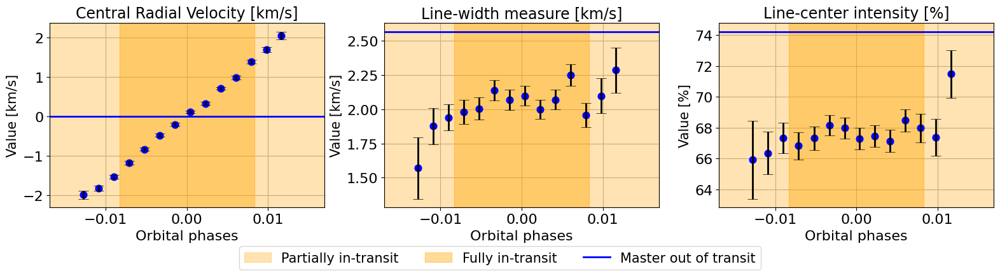

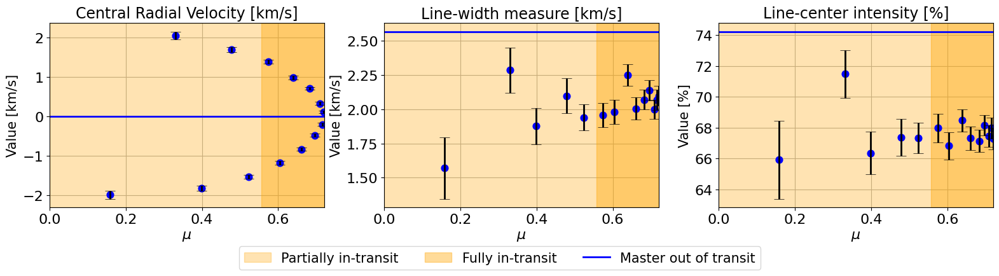

In [44]:
local_params = [central_rv_array, width_array, depth_array]
master_params = [master_central_rv_array, master_width_array, master_depth_array]

hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=False, plot_nested=False, save=None)

Central Radial Velocity [km/s]
------------------------------
Orbital phases


18168it [00:14, 1216.64it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 372264 | eff(%):  4.740 | loglstar: 23.289 < 28.896 < 28.275 | logz: 15.295 +/-  0.098 | stop:  0.871]             
14315it [00:09, 1433.27it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 272246 | eff(%):  5.063 | loglstar: -16.399 < -10.712 < -11.388 | logz: -17.687 +/-  0.067 | stop:  0.929]        


------------------------------
Linear vs Constant
logZ(linear)   = 15.297 ± 0.089
logZ(constant) = -17.722 ± 0.062
log Bayes factor = 33.019
Unconstrained model favored.
------------------------------


17972it [00:13, 1338.97it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 367670 | eff(%):  4.746 | loglstar: 23.242 < 28.901 < 28.301 | logz: 15.723 +/-  0.096 | stop:  0.871]           
14781it [00:09, 1512.05it/s, batch: 5 | bound: 5 | nc: 1 | ncall: 294846 | eff(%):  4.833 | loglstar: -16.056 < -9.178 < -10.660 | logz: -20.442 +/-  0.100 | stop:  0.973]          


Positive vs Negative slope
logZ(m>0)  = 15.739 ± 0.088
logZ(m<0)  = -20.404 ± 0.087
log Bayes factor = -36.143
Positive slope favored.
Linear fit parameters:
m = 167.152810 +/- 2.736859
b = -0.067100 +/- 0.014433
ln_f = -3.246546 +/- 0.890555
------------------------------
------------------------------
mu


18532it [00:13, 1381.30it/s, batch: 6 | bound: 4 | nc: 1 | ncall: 378842 | eff(%):  4.754 | loglstar: -13.101 < -6.715 < -7.936 | logz: -20.927 +/-  0.101 | stop:  0.830]          
15575it [00:10, 1556.68it/s, batch: 7 | bound: 5 | nc: 1 | ncall: 299420 | eff(%):  5.025 | loglstar: -16.211 < -10.713 < -11.370 | logz: -19.923 +/-  0.078 | stop:  0.918]         


------------------------------
Linear vs Constant
logZ(linear)   = -20.877 ± 0.093
logZ(constant) = -19.935 ± 0.072
log Bayes factor = -0.942
Zero-slope model favored
Linear fit parameters:
b = -0.550434 +/- 0.700921
ln_f = 0.769121 +/- 0.205874
------------------------------
Line-width measure [km/s]
------------------------------
Orbital phases


16738it [00:11, 1407.27it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 339428 | eff(%):  4.776 | loglstar: 18.590 < 23.546 < 22.912 | logz: 11.049 +/-  0.093 | stop:  0.963]           
16737it [00:11, 1453.96it/s, batch: 9 | bound: 3 | nc: 1 | ncall: 324825 | eff(%):  4.991 | loglstar: 18.335 < 23.241 < 22.644 | logz: 13.789 +/-  0.072 | stop:  0.876]           


------------------------------
Linear vs Constant
logZ(linear)   = 11.083 ± 0.086
logZ(constant) = 13.792 ± 0.068
log Bayes factor = -2.710
Zero-slope model favored
Linear fit parameters:
b = 2.028149 +/- 0.024551
ln_f = -4.081964 +/- 1.331440
------------------------------
------------------------------
mu


18410it [00:15, 1210.48it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 377554 | eff(%):  4.738 | loglstar: 21.527 < 26.256 < 25.446 | logz: 11.382 +/-  0.098 | stop:  0.923]           
15055it [00:09, 1543.16it/s, batch: 8 | bound: 2 | nc: 1 | ncall: 288089 | eff(%):  5.042 | loglstar: 18.684 < 23.237 < 22.433 | logz: 13.985 +/-  0.077 | stop:  0.988]           


------------------------------
Linear vs Constant
logZ(linear)   = 11.372 ± 0.093
logZ(constant) = 13.976 ± 0.073
log Bayes factor = -2.605
Zero-slope model favored
Linear fit parameters:
b = 2.027902 +/- 0.025016
ln_f = -4.090937 +/- 1.358737
------------------------------
Line-center intensity [%]
------------------------------
Orbital phases


14742it [00:10, 1468.31it/s, batch: 7 | bound: 6 | nc: 1 | ncall: 292827 | eff(%):  4.852 | loglstar: -19.934 < -14.534 < -14.896 | logz: -22.462 +/-  0.075 | stop:  0.945]        
15875it [00:10, 1469.67it/s, batch: 8 | bound: 3 | nc: 1 | ncall: 306208 | eff(%):  5.013 | loglstar: -20.221 < -14.798 < -15.169 | logz: -22.324 +/-  0.066 | stop:  0.857]        


------------------------------
Linear vs Constant
logZ(linear)   = -22.490 ± 0.067
logZ(constant) = -22.309 ± 0.062
log Bayes factor = -0.181
Zero-slope model favored
Linear fit parameters:
b = 66.941800 +/- 0.444837
ln_f = -3.896737 +/- 0.356516
------------------------------
------------------------------
mu


15906it [00:12, 1298.78it/s, batch: 7 | bound: 3 | nc: 1 | ncall: 319623 | eff(%):  4.811 | loglstar: -10.198 < -5.469 < -5.987 | logz: -16.480 +/-  0.086 | stop:  0.976]           
16384it [00:11, 1428.32it/s, batch: 8 | bound: 5 | nc: 1 | ncall: 317173 | eff(%):  5.000 | loglstar: -20.314 < -14.797 < -15.074 | logz: -22.319 +/-  0.065 | stop:  0.832]        


------------------------------
Linear vs Constant
logZ(linear)   = -16.478 ± 0.080
logZ(constant) = -22.358 ± 0.060
log Bayes factor = 5.880
Unconstrained model favored.
------------------------------


17038it [00:11, 1450.23it/s, batch: 6 | bound: 5 | nc: 1 | ncall: 346616 | eff(%):  4.764 | loglstar: -20.901 < -14.850 < -16.088 | logz: -26.706 +/-  0.091 | stop:  0.857]         
15463it [00:10, 1508.33it/s, batch: 7 | bound: 4 | nc: 1 | ncall: 309509 | eff(%):  4.825 | loglstar: -10.317 < -5.468 < -5.703 | logz: -15.500 +/-  0.086 | stop:  0.982]           


Positive vs Negative slope
logZ(m>0)  = -26.727 ± 0.085
logZ(m<0)  = -15.505 ± 0.076
log Bayes factor = 11.222
Negative slope favored.
Linear fit parameters:
m = -10.069783 +/- 1.982163
b = 72.936853 +/- 1.278268
ln_f = -5.693198 +/- 0.900906
------------------------------


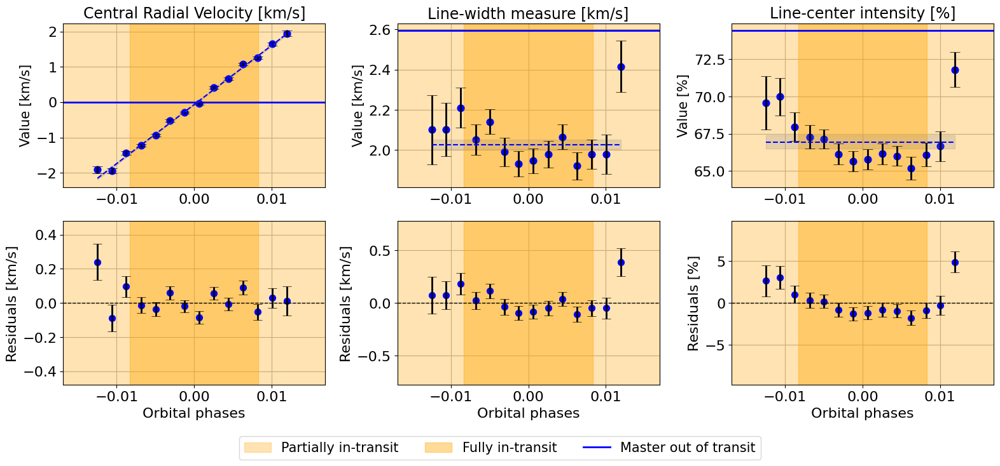

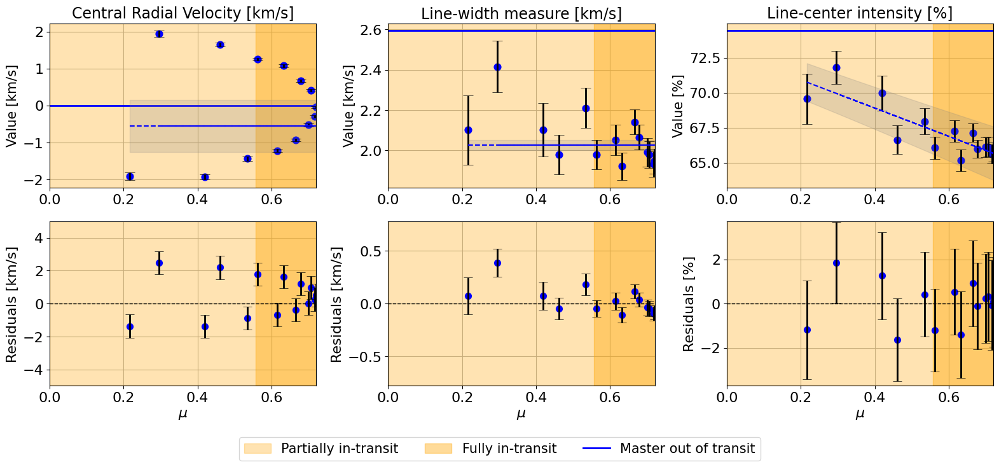

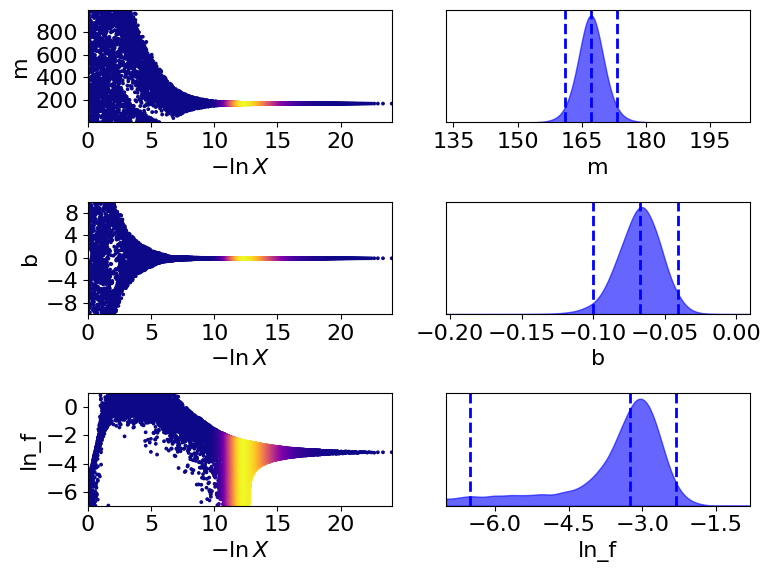

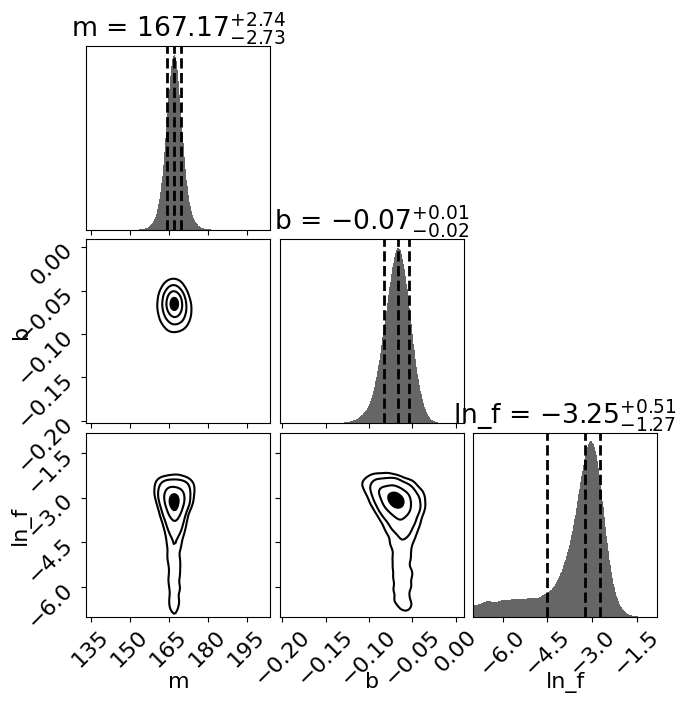

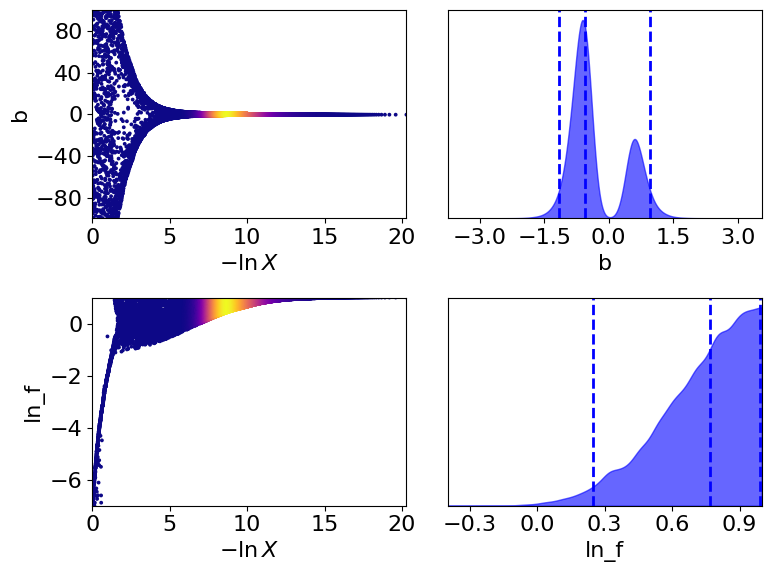

...

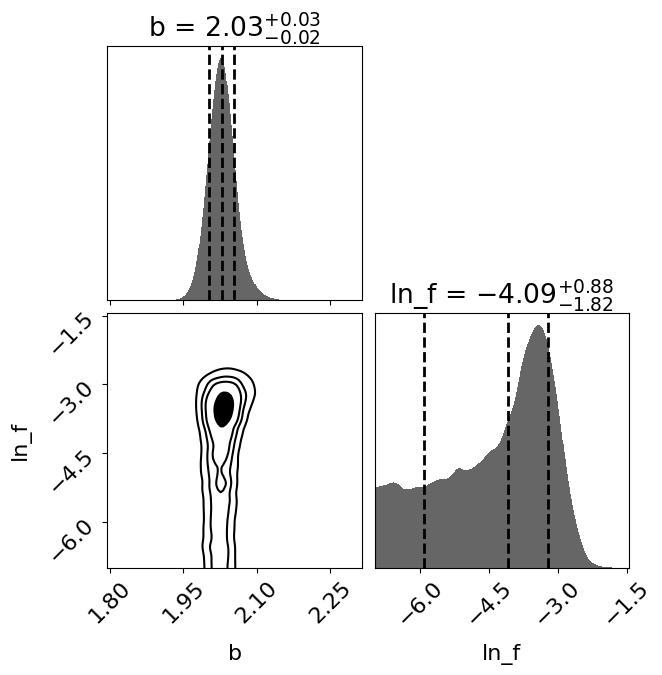

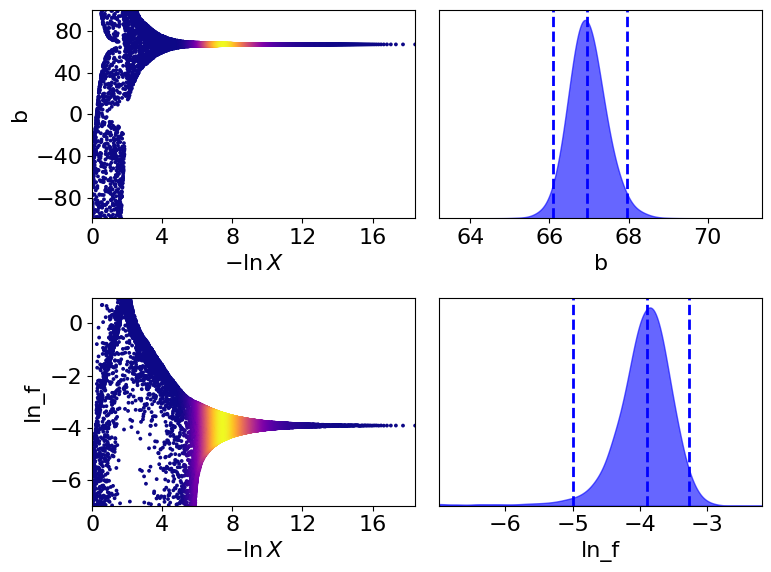

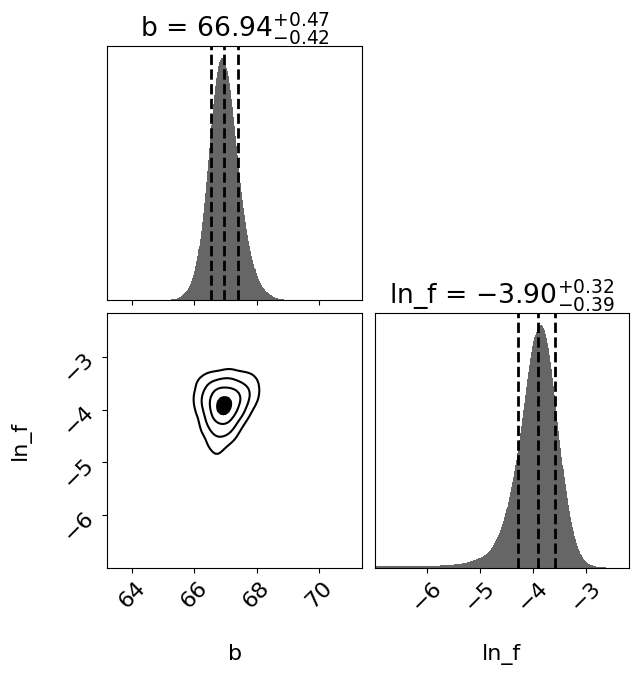

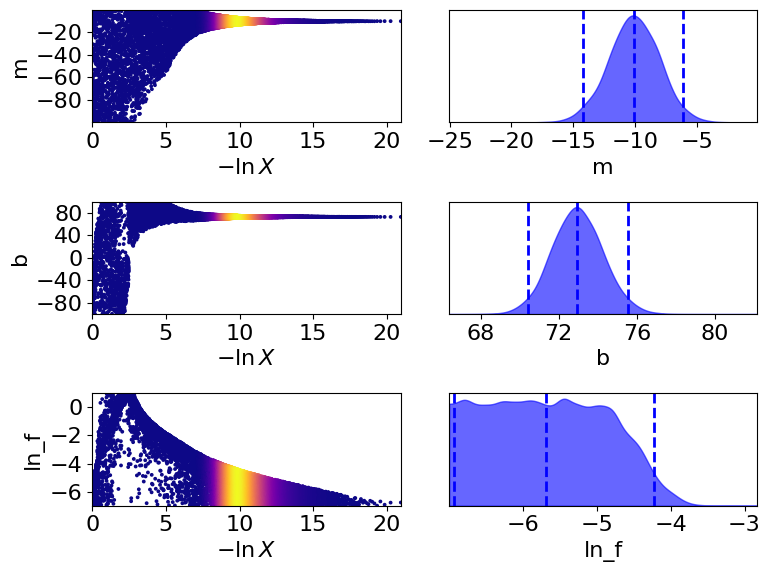

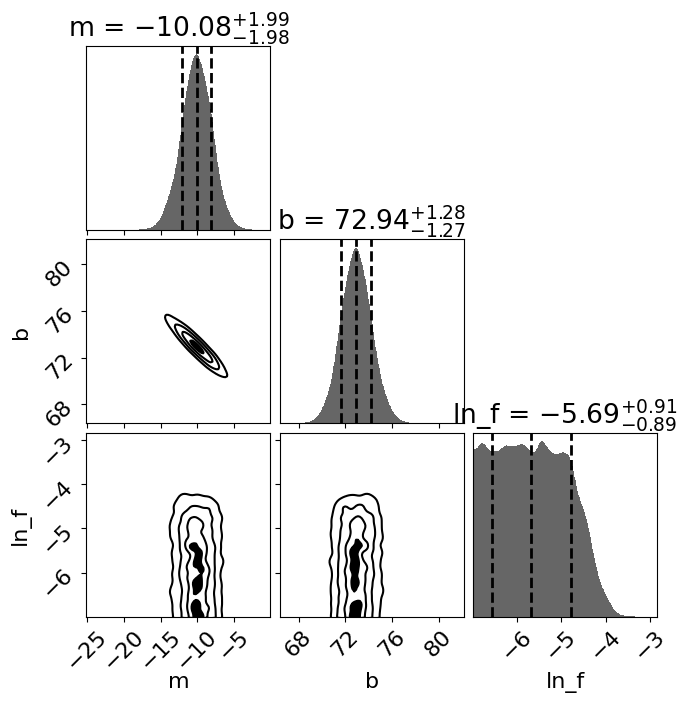

In [35]:
hecate._plot_local_params(indices_final, local_params, master_params, linear_fit=True, plot_nested=True, save=None)